# GLM in fMRI with Nilearn

In this lab series, you will learn how to apply the **General Linear Model (GLM)** to fMRI data using [**Nilearn**](https://nilearn.github.io/).  
We’ll build directly on the dataset from the previous session, but now our focus shifts from *preprocessing* to the **statistical analysis** of brain activity.  

Nilearn is a powerful library that makes it easy to:
- visualise neuroimaging data,
- set up and run GLMs for first-level and higher-level analysis,
- and connect results with machine learning tools (e.g. scikit-learn), which we’ll explore in later parts of the course.

---

## What you’ll learn   
By the end of this lab, you will be able to:
- Visualise statistical maps with Nilearn  
- Set up and run a first-level GLM in Nilearn  
- Combine results across subjects in a higher-level GLM  

---

**Expected time to complete**: 6–7 hours  

**Attribution**:
- Updated by *Joe Bathelt* (2025)
- Developed by *Joe Bathelt* (2024)

In [8]:
# Loading required packages
import matplotlib.pyplot as plt
from nilearn import datasets, image, surface, plotting
import numpy as np
from IPython.display import display
import ipywidgets as widgets

# Part I: Visualising statistical images

Visualisation is a key step in any neuroimaging workflow — after all, it’s called *imaging* for a reason.  
By looking at your statistical maps, you can quickly detect potential errors in the analysis and clearly communicate your findings to others.  

In this section, you will learn how to use **Nilearn** to visualise statistical images effectively.

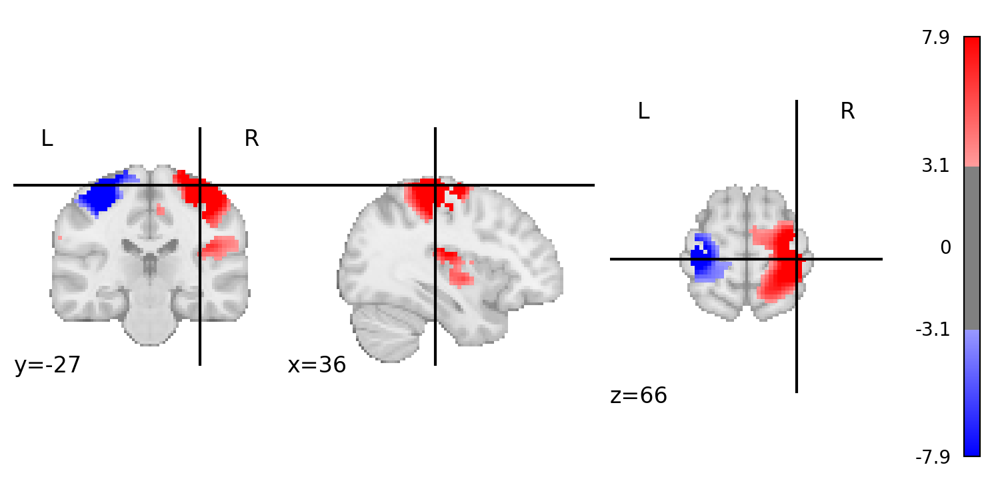

In [7]:
# Loading an example functional image
stat_img = datasets.load_sample_motor_activation_image()

# Visualizing t-map image on EPI template with manual threshold
plotting.plot_stat_map(
    stat_img,
    threshold=3.1, # Statistic threshold
    cut_coords=[36, -27, 66], # MNI coordinates of the slice
    cmap='bwr' # Colour map. Alternatives: 'bwr', 'hot_black_bone'
)

Try adjusting the parameters in the code cell below to see how they affect the visualisation.  
Pay special attention to the **cut coordinates** — how do different settings change the way you interpret the data?

In [8]:
# Function to plot t-map with adjustable parameters
def interactive_stat_map(threshold, x_coord, y_coord, z_coord, cmap):
    plotting.plot_stat_map(
        stat_img,
        threshold=threshold,
        cut_coords=[x_coord, y_coord, z_coord],
        cmap=cmap
    )

# Interactive widgets
threshold_slider = widgets.FloatSlider(value=3.1, min=0, max=10, step=0.1, description="Threshold")
x_coord_slider = widgets.IntSlider(value=36, min=-50, max=50, step=1, description="X Coord")
y_coord_slider = widgets.IntSlider(value=-27, min=-50, max=50, step=1, description="Y Coord")
z_coord_slider = widgets.IntSlider(value=66, min=-50, max=50, step=1, description="Z Coord")
cmap_dropdown = widgets.Dropdown(
    options=['bwr', 'hot_black_bone', 'cyan_orange'],
    value='bwr',
    description="Colormap"
)

# Display interactive plot
widgets.interactive(interactive_stat_map, 
                    threshold=threshold_slider, 
                    x_coord=x_coord_slider, 
                    y_coord=y_coord_slider, 
                    z_coord=z_coord_slider, 
                    cmap=cmap_dropdown)

interactive(children=(FloatSlider(value=3.1, description='Threshold', max=10.0), IntSlider(value=36, descripti…

The figure displays the thresholded statistical map overlaid on the MNI anatomical template.  
The cross marks the chosen **cut coordinates** (also listed below the figure), and the colour bar on the right shows the corresponding **t-values** from the statistical map.

<div class='alert alert-warning'>
<b>ToDo</b> (not graded):  
Experiment with the visualisation settings of the statistical image:  

- **Threshold**: Increase or decrease the threshold.  
- **Colormap**: Switch between different colour maps.  
- **Cut coordinates**: Move the cuts along the x, y, or z-axis.  

👉 What changes do you notice, and how do they affect your interpretation of the results?  
</div>

<details>
<summary><b>Possible observations</b></summary>

- Increasing the **threshold** removes weaker activations, making only the strongest clusters visible.  
- Decreasing the **threshold** can make more clusters appear, but also increases the risk of including noise.  
- Changing the **colormap** does not alter the data, but can make clusters more or less easy to see.  
- Adjusting the **cut coordinates** helps you focus on different regions of the brain and may reveal activations that are not visible in the default slices.  

</details>

The figure above shows activation at a specific location.  
However, we often want to visualise activation across the **entire brain**.  

For this, we can use a **glass brain plot** — a transparent brain outline that displays all activations in a single view.  
The figure below shows the same statistical map as above, but rendered as a glass brain.

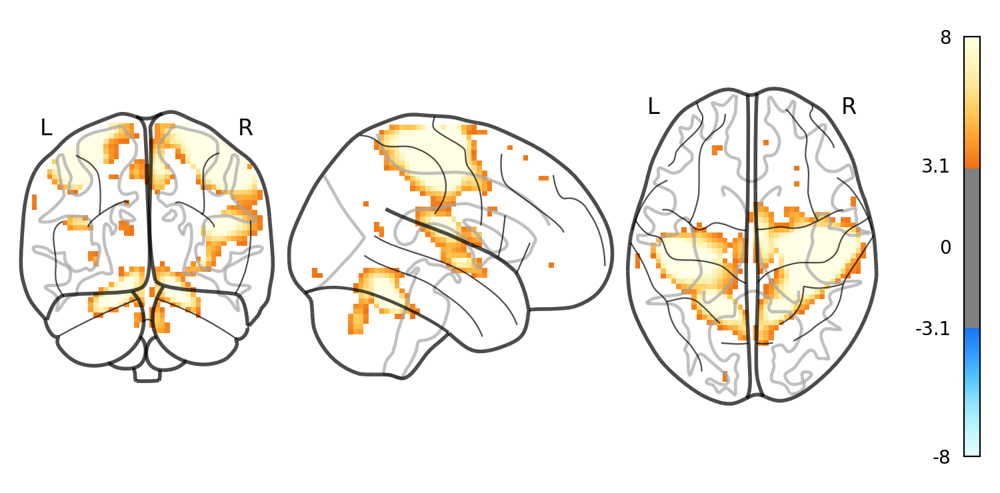

In [9]:
plotting.plot_glass_brain(
    stat_img,
    threshold=3.1,
    cmap='cyan_orange',
    colorbar=True,
    symmetric_cbar=True,
    vmax=8
    )

Try adjusting the parameters in the cell below to explore how they affect the visualisation.  
Pay attention to how changes in the **colormap** or **threshold** influence your interpretation of the data.

In [10]:
# Function to plot glass brain with adjustable parameters
def interactive_glass_brain(threshold, cmap, symmetric_cbar):
    plotting.plot_glass_brain(
        stat_img,
        threshold=threshold,
        cmap=cmap,
        colorbar=True,
        vmax=8,
        symmetric_cbar=symmetric_cbar,
    )

# Interactive widgets
threshold_slider = widgets.FloatSlider(value=3.1, min=0, max=5, step=0.1, description="Threshold")
cmap_dropdown = widgets.Dropdown(
    options=['cyan_orange', 'bwr', 'hot_black_bone'],
    value='cyan_orange',
    description="Colormap"
)
symmetric_cbar_toggle = widgets.Checkbox(value=True, description="Symmetric Colorbar")

# Display interactive plot
widgets.interactive(interactive_glass_brain, 
                    threshold=threshold_slider, 
                    cmap=cmap_dropdown, 
                    symmetric_cbar=symmetric_cbar_toggle)

interactive(children=(FloatSlider(value=3.1, description='Threshold', max=5.0), Dropdown(description='Colormap…

<div class='alert alert-info'>
<b>ToThink (0 points)</b>:  
    What are the advantages and disadvantages of the <b>glass brain plot </b> compared to the <b>anatomical plot</b>?  
When might you choose one over the other?  
</div>

<details>
<summary><b>💡 Possible answers</b></summary>

- **Glass brain plot**  
  - Advantages: gives a quick overview of activations across the whole brain; easy to spot overall patterns.  
  - Disadvantages: less anatomical detail, precise localisation can be difficult.  

- **Anatomical plot**  
  - Advantages: shows activation in relation to brain anatomy; allows precise localisation of effects.  
  - Disadvantages: only displays selected slices or regions, so some activations may be missed.  

👉 In practice:  
- Use a **glass brain** for a fast, whole-brain overview (e.g. in figures summarising results).  
- Use an **anatomical plot** when you need detailed localisation or want to highlight specific regions.  

</details>

Sometimes, instead of visualising activation in the **volume**, we may want to display it directly on the **cortical surface**.  
This is especially useful when highlighting activation patterns along the cortex.  

The figure below shows the same statistical map as before, but now projected onto the cortical surface.  

---

**💡 Side note:**  
It is also possible to perform statistical analysis on the cortical surface rather than in the volume.  
- Supporters argue that surface-based analysis offers **better anatomical specificity**, since it respects the complex folds of the cortex that can be obscured in volumetric representations.  
- Critics note that fMRI data is inherently **voxel-based**, and therefore more naturally analysed in the volume.  
- Surface-based analysis is also more **computationally demanding**.  

The debate remains unresolved, but importantly: the **statistical principles** you are learning in this course apply equally to both surface- and volume-based approaches.

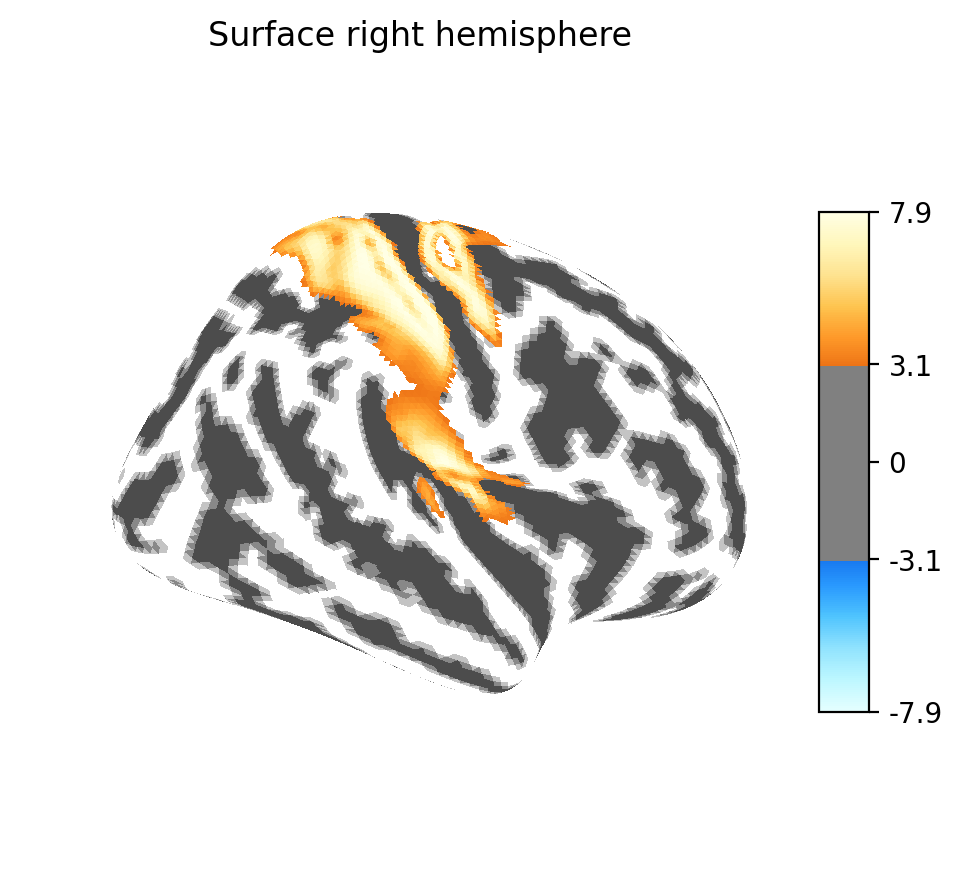

In [11]:
# Loading the surface
fsaverage = datasets.fetch_surf_fsaverage()
curv_right = surface.load_surf_data(fsaverage.curv_right)
curv_right_sign = np.sign(curv_right)

# Mapping the statistical map from volume to the surface
texture = surface.vol_to_surf(stat_img, fsaverage.pial_right)

# Plotting the statistical map on the surface
fig = plotting.plot_surf_stat_map(
    fsaverage.infl_right,
    texture,
    hemi='right',
    title='Surface right hemisphere',
    colorbar=True,
    threshold=3.1,
    cmap='cyan_orange',
    bg_map=curv_right_sign,
)
fig.show()

You can try out different surface in the code cell below. How does your impression of the location of the activation change when you switch between the inflated and white matter surface?

In [12]:
# Load fsaverage surface and sample statistical image
fsaverage = datasets.fetch_surf_fsaverage()
stat_img = datasets.load_sample_motor_activation_image()

# Load surface curvature data and calculate sign
curv_right = surface.load_surf_data(fsaverage.curv_right)
curv_right_sign = np.sign(curv_right)

# Map the statistical map from volume to the surface
texture = surface.vol_to_surf(stat_img, fsaverage.pial_right)

# Function to plot surface map with adjustable parameters
def interactive_surf_stat_map(threshold, cmap, surface_type):
    # Select surface based on user input
    surf_mesh = getattr(fsaverage, surface_type)
    
    plotting.plot_surf_stat_map(
        surf_mesh,
        texture,
        hemi='right',
        title=f'Surface right hemisphere ({surface_type})',
        colorbar=True,
        threshold=threshold,
        cmap=cmap,
        bg_map=curv_right_sign,
    )

# Interactive widgets
threshold_slider = widgets.FloatSlider(value=3.1, min=0, max=10, step=0.1, description="Threshold")
cmap_dropdown = widgets.Dropdown(
    options=['cyan_orange', 'bwr', 'hot_black_bone'],
    value='cyan_orange',
    description="Colormap"
)
surface_dropdown = widgets.Dropdown(
    options=['infl_right', 'white_right', 'sphere_right'],
    value='infl_right',
    description="Surface Type"
)

# Display interactive plot
widgets.interactive(interactive_surf_stat_map, 
                    threshold=threshold_slider, 
                    cmap=cmap_dropdown,
                    surface_type=surface_dropdown)

interactive(children=(FloatSlider(value=3.1, description='Threshold', max=10.0), Dropdown(description='Colorma…

Sometimes it is useful to display the location of specific **anatomical regions** on the brain.  
For example, you might want to:  
- show the outline of a **region of interest (ROI)**, or  
- provide additional anatomical context to help interpret the results of a whole-brain analysis.  

In the example below, we load an anatomical atlas and plot the outline of a selected region.  
Here we highlight the **motor cortex**, since the statistical map comes from a motor task.

In [13]:
# Function to plot the brain with different atlas label overlays
def interactive_atlas_brain(region_label):

    # Loading the Harvard-Oxford cortical atlas
    dataset_ho = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")

    # Specify the region of interest by its label
    region_index = dataset_ho.labels.index(region_label)

    # Load the atlas image
    atlas_img = image.load_img(dataset_ho.filename)

    # Create a binary mask for the region of interest
    region_mask_data = np.zeros(atlas_img.shape, dtype=np.int32)
    region_mask_data[atlas_img.get_fdata() == region_index] = 1

    # Create a Nifti image for the region mask
    region_mask_img = image.new_img_like(atlas_img, region_mask_data)

    # Display the region mask
    plotting.plot_roi(region_mask_img,
                    view_type='contours',
                    title=f'Region: {region_label}')
    plotting.show()

# Loading the Harvard-Oxford cortical atlas
dataset_ho = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")

# Interactive widgets
region_dropdown = widgets.Dropdown(
    options=dataset_ho.labels,
    value='Precentral Gyrus',
    description="Atlas Label"
)

# Display interactive plot
widgets.interactive(interactive_atlas_brain,
                    dataset_ho=dataset_ho,
                    region_label=region_dropdown)

interactive(children=(Dropdown(description='Atlas Label', index=7, options=('Background', 'Frontal Pole', 'Ins…

We can combine the visualisation of the ROI with the statistical map:

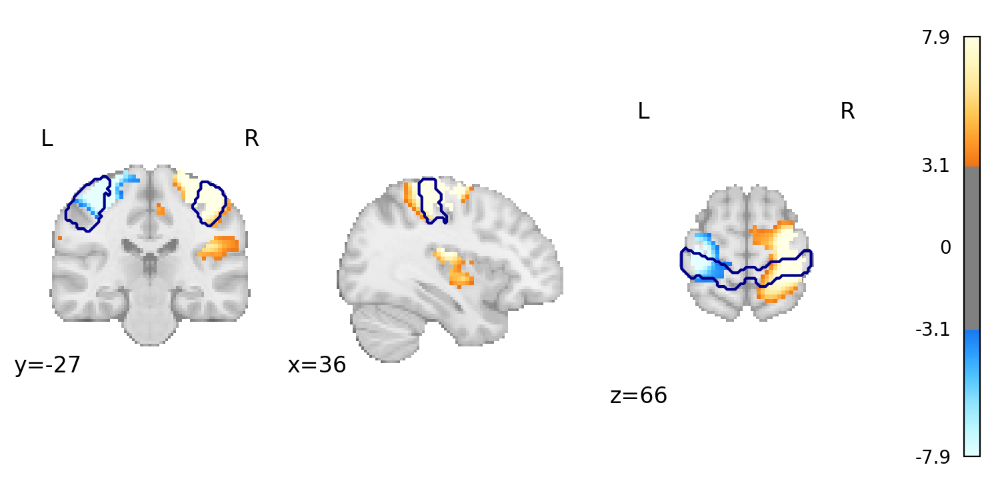

In [14]:
# Loading the Harvard-Oxford cortical atlas
dataset_ho = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")

# Specify the region of interest by its label
region_index = dataset_ho.labels.index('Postcentral Gyrus')

# Load the atlas image
atlas_img = image.load_img(dataset_ho.filename)

# Create a binary mask for the region of interest
region_mask_data = np.zeros(atlas_img.shape, dtype=np.int32)
region_mask_data[atlas_img.get_fdata() == region_index] = 1

# Create a Nifti image for the region mask
region_mask_img = image.new_img_like(atlas_img, region_mask_data)

display = plotting.plot_stat_map(
    stat_img,
    threshold=3.1, # Statistic threshold
    cut_coords=[36, -27, 66], # MNI coordinates of the slice
    cmap='cyan_orange', # Colour map. Alternatives: 'bwr', 'hot_black_bone'
    draw_cross=False
)
display.add_contours(region_mask_img, levels=[0.5], colors='darkblue')
plotting.show()

Once you are happy with a plot, you can save it to a file using **`plt.savefig()`**.  
- The **filename extension** determines the file format (e.g. `my_figure.png` for PNG, `my_figure.pdf` for PDF).  
- Important: call `plt.savefig()` **before** `plt.show()`.  
  If you save after showing, the figure will be cleared and the saved file will be empty.

<div class='alert alert-warning'>
<b>ToDo (1 point)</b>: Create a visualisation of the statistical map shown below.  

**Instructions:**  
- Use a **glass brain plot**  
- Apply a **threshold of 3.1**  
- Use the **'bwr' colormap**  
- Set the **title** to: *"Reading > Checkerboard"*  
- Assign the resulting plot to the variable **`fig`**  

    
💡 **Note**: This will be graded manually (no feedback cell).
</div>

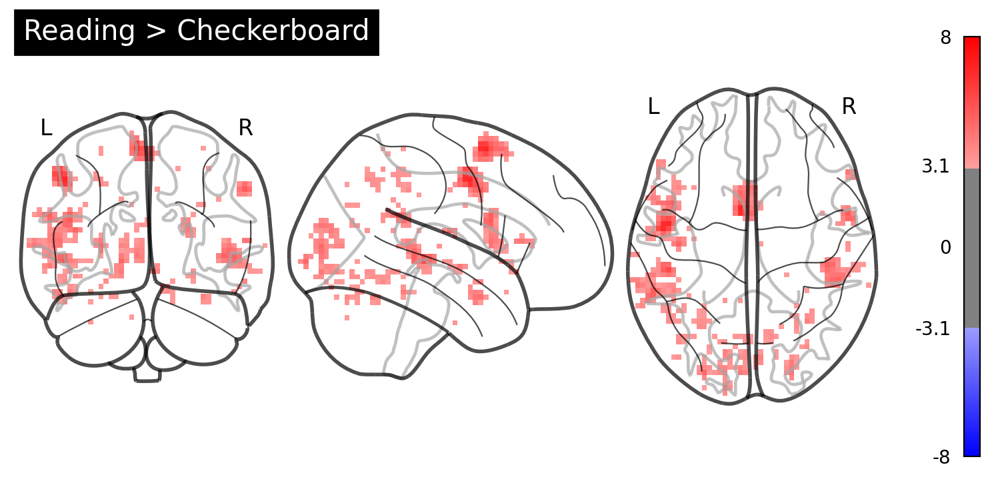

In [15]:
from nilearn import plotting, image
import matplotlib.pyplot as plt

# Load the language meta-analysis statistical image
stat_img = datasets.fetch_localizer_contrasts(
     ['sentence reading vs checkerboard'], 
     n_subjects=1, 
     get_tmaps=True
)['tmaps'][0]

# YOUR CODE HERE
fig = plotting.plot_glass_brain(
    stat_img,
    threshold = 3.1,
    cmap = 'bwr',
    colorbar = True,
    symmetric_cbar = True,
    vmax = 8, 
    title = "Reading > Checkerboard"
    )
# raise NotImplementedError()

# Save the figure
fig.savefig("reading_v_checkerboard.png")
plt.show()

In this section, you learned how to plot statistical images using **Nilearn**.  
These skills are essential for the upcoming exercises, where we will fit statistical models to fMRI data.  

Remember: **visualising your data is one of the best ways to catch errors and build intuition** about your analysis.

# Part 2: First-level analysis  

### The *NI-edu* dataset  
For the following analyses, we will use real fMRI data from a dataset we’ll call *NI-edu*.  
This dataset was collected at our **3T scanner at the University of Amsterdam** and was specifically designed for this course (and the follow-up on pattern analysis).  

The experimental paradigms focus on **face processing** and the representation of subjective impressions (e.g., perceived attractiveness, dominance, and trustworthiness).  
In addition, the dataset includes several runs of a **functional localizer** task, which identifies brain regions that respond preferentially to particular object categories (faces, bodies, characters, etc.).  

In this course, we will mainly use the **localizer data**.  
This task has a relatively simple design and produces robust signals, making it well suited for illustrating the principles of first-level analysis.  

---

### Contents of the dataset  
We will introduce the dataset in more detail as we work through the exercises. For now, here are the basics:  

- The full dataset includes **13 participants**, each scanned **twice** (on separate days).  
- Each participant has their own folder, which contains:  
  - an **`anat/`** directory with anatomical MRI files  
  - a **`func/`** directory with functional MRI files  

This is the same dataset that we already worked with last week. We will encounter a bit more of the content of this BIDS dataset this week when we get to the analysis of the fMRI data.

Specifically, we will use the following files from the dataset:
* **derivatives**: This folder contains the preprocessed data after running the fMRIprep pipeline. This includes the functional and anatomical data in MNI space.
* **event files**: these are the files ending in `_events.tsv`, which contain information about the onset/duration of events during the fMRI paradigm.

### MRI acquisition parameters  

For each participant, we acquired:  

- **Anatomical scan**: one high-resolution **T1-weighted** image ($1 \times 1 \times 1$ mm).  
- **Functional scans**: (T2*-weighted) **gradient-echo echo-planar imaging (GE-EPI)** sequence with:  
  - TR = 700 ms  
  - TE = 30 ms  
  - voxel size = $2.7 \times 2.7 \times 2.7$ mm  

The functional scans used a [**multiband acceleration factor**](http://mriquestions.com/simultaneous-slices.html) of 4.  
This “simultaneous multislice” technique acquires data from several slices within a single RF pulse, which **greatly accelerates acquisition time**.

<div class='alert alert-info'>
<b>ToThink (1 point)</b>:  
Faster acquisition does not just shorten scanning sessions.  

👉 What could be another advantage of shorter TRs?  
Hint: Think back to last week’s lecture on preprocessing.  
    
💡 Keep your explanation concise — this will be graded manually (no feedback cell).
</div>

Having shorter TRs would reduce the time delay between the first and last slice in a volume. Since the interpolation error is smaller, there will be improved slice\-time correction during preprocessing.


### Experimental paradigms  

This dataset includes two types of experimental paradigms:  

1. A **functional localizer** task (abbreviated *floc*)  
2. A **face perception** task (*face*)  

(We also collected a **resting-state scan** without an explicit task, which we will use in Week 7.)  

Each participant completed both floc paradigms (blocked and event-related) once per session, and **6 face runs per session** (12 in total).  

---

#### Functional localizer (floc)  

The functional localizer was developed by the [Stanford Vision & Perception Neuroscience Lab](http://vpnl.stanford.edu/fLoc/).  
It includes images from several categories:  

- **Characters**: random strings of letters and numbers  
- **Bodies**: full bodies without heads, or close-ups of limbs  
- **Faces**: adults and children  
- **Places**: houses and hallways  
- **Objects**: e.g. musical instruments, cars  

These categories were chosen to activate known (and arguably category-selective) regions in the visual system:  

- **Faces** → occipital face area (OFA), fusiform face area (FFA)  
- **Places** → parahippocampal place area (PPA)  
- **Characters** → visual word form area (VWFA)  
- **Bodies** → extrastriate body area (EBA)  

During the localizer task, participants performed a simple [**one-back task**](https://en.wikipedia.org/wiki/N-back): pressing a button with their right hand whenever the exact same image appeared twice in a row (≈10% of trials).  

---

#### Blocked vs. event-related designs  

We collected the localizer in two versions:  

- **flocBLOCKED**  
  - Blocked design  
  - Each stimulus: 400 ms  
  - Fixed inter-stimulus interval (ISI): 100 ms  
  - Blocks of 12 stimuli (≈6 s)  
  - Each run began and ended with a 6 s “null block” (no stimuli) + 6 randomly inserted null blocks  

- **flocER**  
  - Event-related design  
  - Each stimulus: 400 ms  
  - ISIs drawn from an exponential distribution (2–8 s, min 2 s)  
  - Only null blocks at the start and end of the run  

![floc_paradigm](https://docs.google.com/drawings/d/e/2PACX-1vStNqan0MgQluLbUh_R6C0R96juxmLE_K_MJLWEisHJaqcsT0AmffdpoU6HEXSLRdHQhOxW1NM8WUd8/pub?w=1102&h=646)  

---

#### Why two versions?  

The two designs illustrate the trade-off between:  
- **Detection efficiency** → better in blocked designs  
- **Estimation efficiency** → better in event-related designs  

For this course, we will focus on the **blocked version** (*flocBLOCKED*), since it produces robust signals and is easier to work with.  

## Background on first-level analyses  

A **first-level analysis** refers to analysing the fMRI data of a **single participant**.  
The main steps are:  

1. **Preprocessing**  
   - Corrects for artefacts and prepares the data for analysis  
   - Includes motion correction, slice-timing correction, spatial normalisation, and spatial smoothing  
   - Typically performed using pipelines such as *fMRIPrep*  

2. **Model specification**  
   - Defines how the experimental design is expected to relate to the observed data  
   - Includes predictors for each condition, plus nuisance regressors (e.g. head motion)  

3. **Estimation**  
   - Fits the specified model to the data  
   - Produces parameter estimates for each predictor  

4. **Contrasts**  
   - Combines parameter estimates into comparisons that test specific hypotheses  
   - Usually expressed as linear combinations of the estimated parameters  

---

In the previous notebook, we focused on **preprocessing**.  
Here, we turn to the next steps: **model specification, estimation, and contrasts**.  

In [16]:
# Downloading the required files
import os
import urllib.request

def download_file(url, outfile):
    """Download file from URL if not already present."""
    if not os.path.exists(outfile):
        print(f"Downloading {outfile}...")
        urllib.request.urlretrieve(url, outfile)
        print(f"Saved as {outfile}")
    else:
        print(f"{outfile} already exists, skipping download.")

# Downloading some required data
download_file(
    "https://www.dropbox.com/scl/fi/lzn45xzix3impqy8je652/sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv?rlkey=n1ee5hl7x3gb6balvv0ogrkaa&dl=1",
    "sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv"
)

download_file(
    "https://www.dropbox.com/scl/fi/6dmmh7yrf2vla7c1ydnmk/sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz?rlkey=ikkmhl6ru65j3ddtq2ajpx8tz&dl=1",
    "sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz"
)

download_file(
    "https://www.dropbox.com/scl/fi/2ruyaxfamq383smeojlp4/sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz?rlkey=2kdevsmm8jbnxgruxrgxhv6y9&dl=1",
    "sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz"
)

download_file(
    "https://www.dropbox.com/scl/fi/lpyjivgsf2c7ejasvoze9/sub-03_ses-1_task-flocBLOCKED_events.tsv?rlkey=uyi5gsiyzishysgpsxe8w2yr9&dl=1",
    "sub-03_ses-1_task-flocBLOCKED_events.tsv"
)

download_file(
    "https://www.dropbox.com/scl/fi/vvb4pkjfszd9gcfii8tiz/sub-01_task-auditoryoddball_events.tsv?rlkey=aa9qzxiz3211cb10bnedfsp4n&dl=1",
    "sub-01_task-auditoryoddball_events.tsv"
)

sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv already exists, skipping download.
sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz already exists, skipping download.
sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz already exists, skipping download.
sub-03_ses-1_task-flocBLOCKED_events.tsv already exists, skipping download.
sub-01_task-auditoryoddball_events.tsv already exists, skipping download.


First, we need to extract the relevant information from the **event file**.  
For this analysis, we will use three columns:  

- **`onset`** → when the stimulus appeared  
- **`duration`** → how long the stimulus was shown  
- **`trial_type`** → which type of stimulus was presented  

In [17]:
import pandas as pd

events_df = pd.read_csv('./sub-03_ses-1_task-flocBLOCKED_events.tsv', sep='\t')
events = events_df[['onset', 'duration', 'trial_type']]
print(events.head())

      onset  duration trial_type
0  6.028594  0.374968     object
1  6.520242  0.383304     object
2  7.020227  0.383306     object
3  7.520218  0.383302     object
4  7.645309  0.100000   response


We also need to account for **confounds** in our analysis.  
In this case, we will include:  

- the **six motion parameters** (3 translations, 3 rotations)  
- the **global signal**  
- the signals from **white matter (WM)** and **cerebrospinal fluid (CSF)**  

All of these confounds are already provided in the confounds file.  
Let’s load the file and take a look at its contents.  

In [18]:
import numpy as np

confounds_df = pd.read_csv('./sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv', sep='\t')
confounds = confounds_df[['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z', 'global_signal', 'white_matter', 'csf']].replace(np.nan, 0)

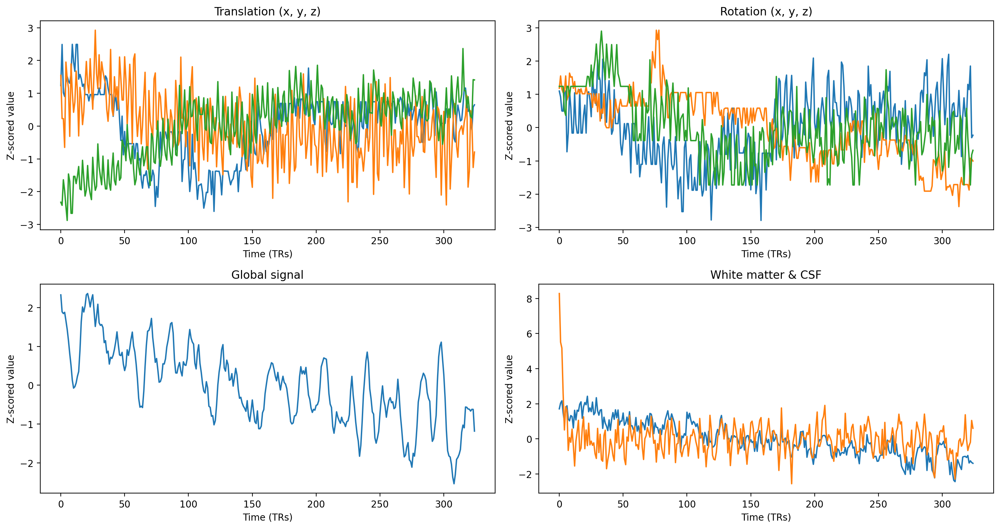

In [19]:
import matplotlib.pyplot as plt
from scipy.stats import zscore

fig, axes = plt.subplots(2, 2, figsize=(15, 8))

# Translation parameters
axes[0, 0].plot(confounds[['trans_x', 'trans_y', 'trans_z']].apply(zscore))
axes[0, 0].set_title('Translation (x, y, z)')
axes[0, 0].set_xlabel('Time (TRs)')
axes[0, 0].set_ylabel('Z-scored value')

# Rotation parameters
axes[0, 1].plot(confounds[['rot_x', 'rot_y', 'rot_z']].apply(zscore))
axes[0, 1].set_title('Rotation (x, y, z)')
axes[0, 1].set_xlabel('Time (TRs)')
axes[0, 1].set_ylabel('Z-scored value')

# Global signal
axes[1, 0].plot(confounds[['global_signal']].apply(zscore))
axes[1, 0].set_title('Global signal')
axes[1, 0].set_xlabel('Time (TRs)')
axes[1, 0].set_ylabel('Z-scored value')

# White matter & CSF
axes[1, 1].plot(confounds[['white_matter', 'csf']].apply(zscore))
axes[1, 1].set_title('White matter & CSF')
axes[1, 1].set_xlabel('Time (TRs)')
axes[1, 1].set_ylabel('Z-scored value')

plt.tight_layout()
plt.show()

<div class='alert alert-warning'>

<b>ToDo (2 points)</b>:  
In our analysis, we typically include the **six motion parameters** (3 translations, 3 rotations) to account for head movement.  
For most analyses this is sufficient, but sometimes it is useful to add **extra confounds** — for example, the **first derivatives** of the motion parameters, which capture sudden changes in movement.  

👉 Your task:  
- Load the **first derivatives** of the motion parameters (they are already included in the confounds file).
- Replace the initial NA values with 0
- Convert the values to **z-scores**.
- Save them in a variable called **`motion_derivatives`**.  
- Plot them to inspect their time course.

💡 **Note**: This will be graded manually.

</div>

In [20]:
# --- Extract the motion parameters here ---

# YOUR CODE HERE
motion_derivatives = confounds_df[['trans_x_derivative1', 'trans_y_derivative1', 'trans_z_derivative1', 'rot_x_derivative1', 'rot_y_derivative1', 'rot_z_derivative1']].replace(np.nan, 0)
motion_derivatives = motion_derivatives.apply(zscore) # converted to z scores
print(motion_derivatives.head)
# raise NotImplementedError()

<bound method NDFrame.head of      trans_x_derivative1  trans_y_derivative1  trans_z_derivative1  \
0               0.003626             0.006198            -0.017073   
1               2.522187            -1.129654            -0.157346   
2              -2.946618             0.006131             1.142230   
3              -0.233524            -0.750640            -0.520484   
4               0.889455             2.247300            -0.726850   
..                   ...                  ...                  ...   
320             0.126143             0.422749            -0.607685   
321            -0.606528             1.594776            -0.308047   
322            -0.636457            -0.350716            -0.098124   
323             1.397731            -1.127022             1.719607   
324             0.139408             0.412086            -0.030612   

     rot_x_derivative1  rot_y_derivative1  rot_z_derivative1  
0             0.004844           0.016830           0.007686  
1  

In [21]:
# Feedback cell
if "motion_derivatives" not in locals():
    print('The variable "motion_derivatives" is not defined. Check that you created and named the variable correctly.')
elif not motion_derivatives.shape == (325,6):
    print('"motion_derivatives" should be a vector with shape (325,6).')
elif not np.isclose(np.mean(motion_derivatives.values), 0.0, rtol=1e-2):
    print("Did you z-score the motion derivatives? The mean should be close to 0.")
elif not np.isclose(np.std(motion_derivatives.values), 1.0, atol=1e-1):
    print("Did you z-score the motion derivatives? The standard deviation should be close to 1.")
else:
    print('Your answer passed the automated checks.')

Your answer passed the automated checks.


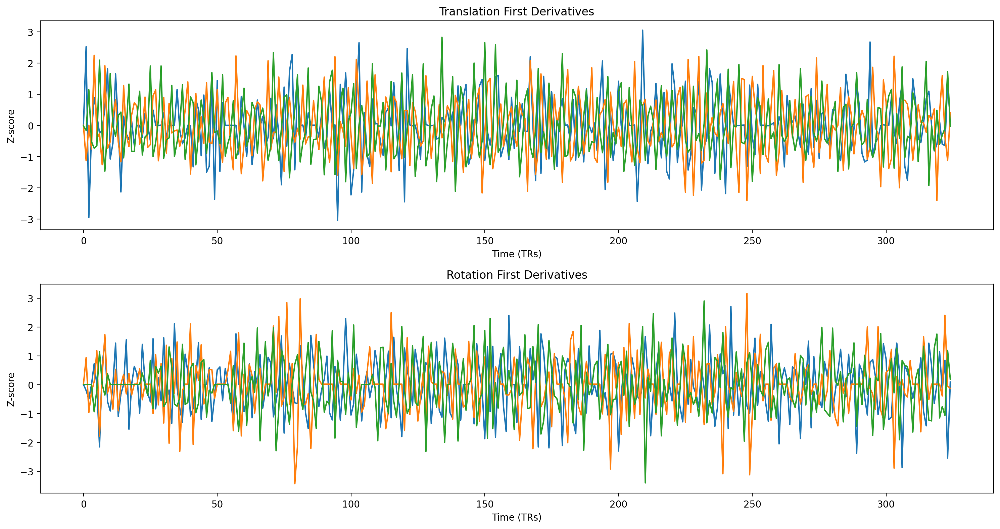

In [22]:
# --- Plot the derivatives of the motion parameters here ---

# YOUR CODE HERE
fig, axes = plt.subplots(2,1, figsize=(15, 8))
axes[0].plot(motion_derivatives[['trans_x_derivative1', 'trans_y_derivative1', 'trans_z_derivative1']])
axes[0].set_title('Translation First Derivatives')
axes[0].set_xlabel('Time (TRs)')
axes[0].set_ylabel('Z-score')

axes[1].plot(motion_derivatives[['rot_x_derivative1', 'rot_y_derivative1', 'rot_z_derivative1']])
axes[1].set_title('Rotation First Derivatives')
axes[1].set_xlabel('Time (TRs)')
axes[1].set_ylabel('Z-score')

plt.tight_layout()
# raise NotImplementedError()

#### Creating the model  

Next, we define the settings for our **first-level GLM**.  

In this analysis, we will use:  

- the **SPM model** for the hemodynamic response function (HRF)  
- a **high-pass filter** of 0.01 Hz to remove low-frequency drifts  
- an **AR(1)** model for temporal autocorrelation  
- **spatial smoothing** with a 4 mm FWHM kernel  
- the **confound regressors** we loaded earlier 

In [23]:
from nilearn.glm.first_level import FirstLevelModel

fmri_glm = FirstLevelModel(t_r=0.7,
                           noise_model='ar1',
                           high_pass=0.01,
                           hrf_model='spm',
                           mask_img='./sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz',
                           smoothing_fwhm=4,
                           signal_scaling=False,
                           minimize_memory=False)

Next, we fit the model to the data. Treat yourself to a hot drink or stretch your legs – this may take a few minutes.

In [24]:
# Define base set of confounds
confound_vars = [
    'global_signal', 'csf', 'white_matter',
    'rot_x', 'rot_y', 'rot_z',
    'trans_x', 'trans_y', 'trans_z'
]

# Add first derivatives of each confound
confound_vars += [f'{var}_derivative1' for var in confound_vars]

# Select confounds from the dataframe and replace missing values with 0
confounds = confounds_df[confound_vars].fillna(0)

# Select relevant columns from the events dataframe
events = events_df[['onset', 'duration', 'trial_type']]

# Fit the first-level GLM
fmri_glm_fit = fmri_glm.fit(
    'sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
    events=events,
    confounds=confounds
)

Let’s take a look at the **design matrix**.  
This matrix encodes the experimental design and the confounds included in the model:  

- Each **column** corresponds to a predictor (e.g., an event type, a confound, or a drift term).  
- Each **row** corresponds to a time point (TR) in the experiment.  
- The values indicate how strongly each predictor contributes at each time point.  

For the experimental conditions, the event timings have been **convolved with the hemodynamic response function (HRF)**, so the predictors reflect the expected BOLD signal rather than simple 0/1 on–off events.  
In addition, the matrix includes the **confound regressors** we added earlier, as well as **drift terms** to capture slow signal fluctuations.  

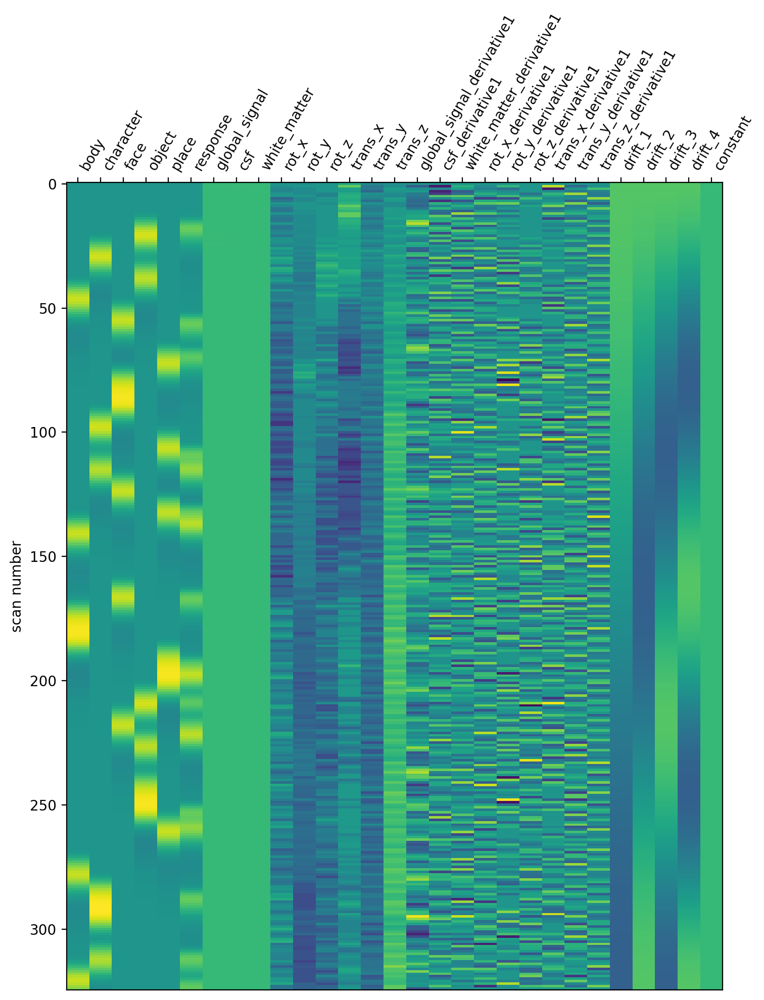

In [25]:
from nilearn import plotting

design_matrix = fmri_glm.design_matrices_[0]

plotting.plot_design_matrix(design_matrix)
plotting.show()

We can also look at the expected response for each event type. This is the convolution of the HRF with the event onsets. The HRF is a canonical response that is expected to occur in the brain in response to a brief stimulus. The convolution of the HRF with the event onsets gives us the expected response for each event typeaWe can also examine the **expected response** for each event type.  
This is obtained by **convolving the event onsets with the hemodynamic response function (HRF)**.  

- The HRF is a **canonical model** of the BOLD signal following a brief neural event.  
- By convolving the HRF with the event timings, we generate predictors that approximate the **expected BOLD response** for each event type.  

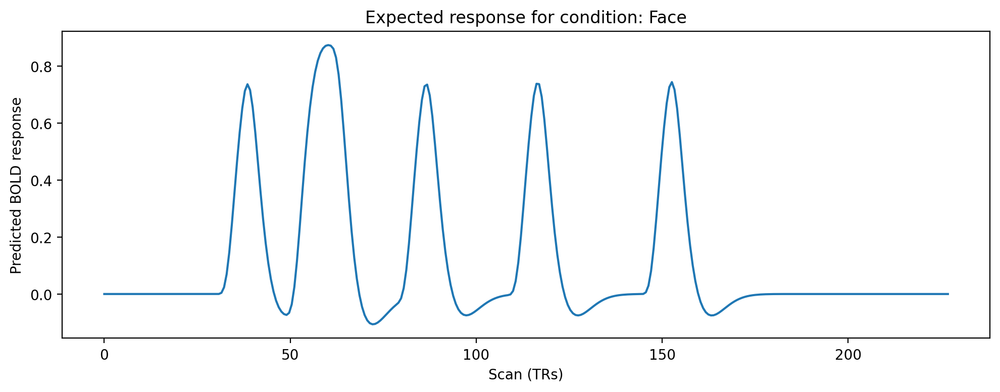

In [26]:
plt.figure(figsize=(10, 4))
plt.plot(design_matrix['face'], label='Face condition')
plt.xlabel('Scan (TRs)')
plt.ylabel('Predicted BOLD response')
plt.title('Expected response for condition: Face')
plt.tight_layout()
plt.show()

<div class='alert alert-warning'>

<b>ToDo (1 point)</b>:  
Imagine we are analysing data from a **different experiment**:  
Participants heard sequences of tones and pressed a button whenever a **target tone** differed from the preceding **standard tones**.  

👉 Your tasks:  
1. Load the **event file** for this experiment.  
2. Create the **design matrix** for this experiment.  
3. Plot the design matrix.  

💡 **Note:** Keep all other settings the same as in the previous example.

💡 **Note**: This will be graded manually (no feedback cell).

</div>

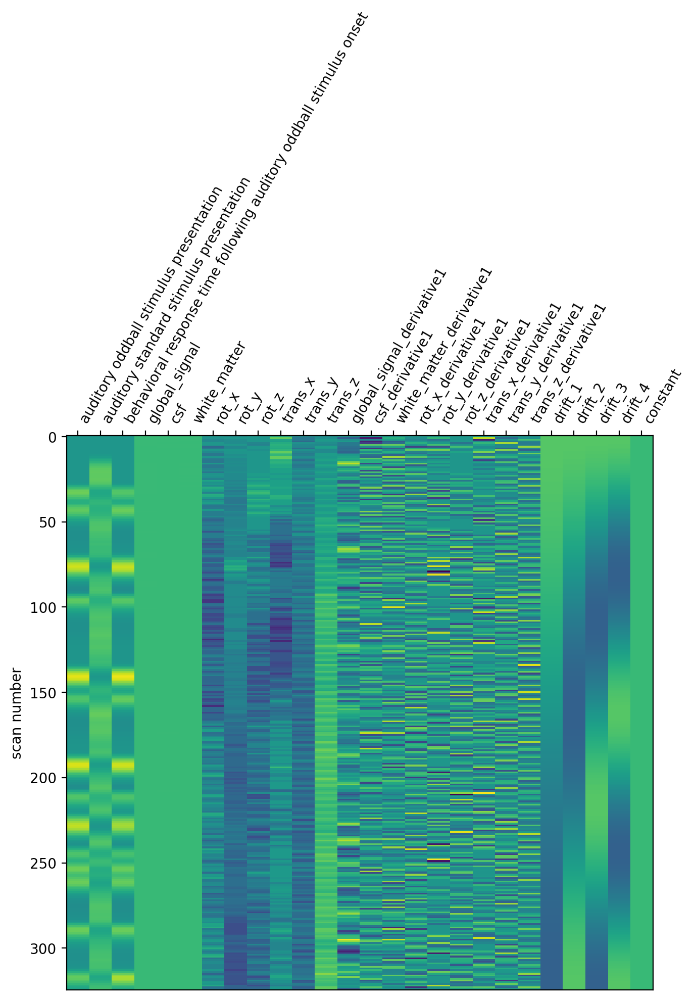

In [27]:
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.plotting import plot_design_matrix

audio_event_filename = 'sub-01_task-auditoryoddball_events.tsv'

# YOUR CODE HERE
# loading files
audio_events_df = pd.read_csv(audio_event_filename, sep='\t')
audio_events = audio_events_df[['onset', 'duration', 'trial_type']].replace(np.nan, 0)
# print(audio_events.head())

# design matrix
audio_fmri_glm = FirstLevelModel(t_r = 0.7,
                           noise_model = 'ar1',
                           hrf_model = 'spm',
                           mask_img = './sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz',
                           smoothing_fwhm = 4,
                           signal_scaling = False,
                           minimize_memory = False)


audio_fmri_glm_fit = audio_fmri_glm.fit('sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz', events=audio_events, confounds=confounds)

audio_design_matrix = audio_fmri_glm.design_matrices_[0]

plotting.plot_design_matrix(audio_design_matrix)
plotting.show()
# raise NotImplementedError()

#### Defining contrasts  

Once we have fitted our first-level model, the next step is to test **specific hypotheses** about brain activity.  
For this, we define **contrasts**.  

- A **contrast** specifies a linear combination of the model parameters (columns of the design matrix).  
- By applying a contrast, we can ask questions such as:  
  - *Which voxels respond more strongly to faces than to bodies?*  
  - *Which voxels are more active during faces than during baseline?*  

The result of fitting a contrast is a **statistical map** (e.g., a t-map).  
This map highlights the voxels where the contrast shows significant activation.  
We can then apply a **threshold** to focus only on voxels that pass a chosen significance level.  

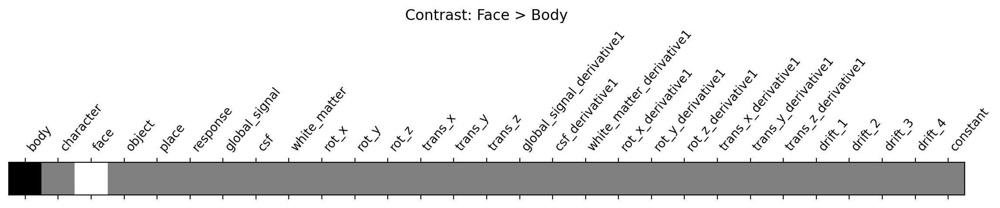

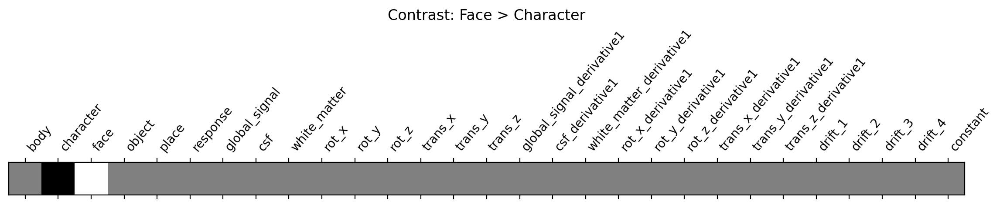

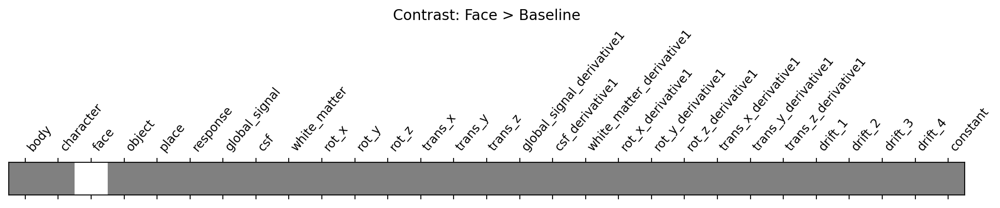

In [28]:
from nilearn import plotting

# Define contrasts as linear combinations of design matrix columns
contrasts = {
    "Face > Body":      np.array([-1.,  0.,  1., 0., 0.]),
    "Face > Character": np.array([ 0., -1.,  1., 0., 0.]),
    "Face > Baseline":  np.array([ 0.,  0.,  1., 0., 0.]),
}

# Pad each contrast to match the number of columns in the design matrix (confounds are set to 0)
n_cols = design_matrix.shape[1]
for name, vector in contrasts.items():
    contrasts[name] = np.pad(vector, (0, n_cols - len(vector)), mode="constant")

# Plot each contrast matrix for inspection
for contrast_name, contrast_vector in contrasts.items():
    plotting.plot_contrast_matrix(contrast_vector, design_matrix=design_matrix)
    plt.title(f"Contrast: {contrast_name}")
    plt.show()

<div class='alert alert-warning'>

<b>ToDo (4 points)</b>:  
Complete the following contrasts in the dictionary called **`new_contrasts`** below.  

👉 Create the following contrast vectors:  
1. **Face > Object**  
2. **Place > Face**  
3. **Face > (Object + Place)**  
4. **Face > (Object + Place + Body)**  
    
💡**Note**: You can ignore the confound columns. The zeroes will be added automatically.

</div>

In [29]:
# YOUR CODE HERE
new_contrasts = {
    'Face > Object': np.array([0., 0., 1., -1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
    'Place > Face': np.array([0., 0., -1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
    'Face > (Object + Place)': np.array([0., 0., 1., -(1/2), -(1/2), 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
    'Face > (Object + Place + Body)': np.array([-(1/3), 0., 1., -(1/3), -(1/3), 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
    }
# raise NotImplementedError()

In [30]:
# Feedback cell
if 'new_contrasts' not in locals():
    print('The variable "new_contrasts" is not defined. Check that you created and named the variable correctly.')
elif not new_contrasts["Face > Object"].shape == (29,):
    print('Each contrast should have 29 rows.')
elif np.sum(np.sum(new_contrasts)) == 0:
    print('The contrasts should sum to 0.')
print('Your answer passed the automated checks.')

Each contrast should have 29 rows.
Your answer passed the automated checks.


In [31]:
assert np.all(new_contrasts["Face > Object"][0:5] == [0.,  0.,  1., -1.,  0.])

In [32]:
assert np.all(new_contrasts["Place > Face"][0:5] ==  [0.,  0., -1.,  0.,  1.])

In [33]:
assert np.all(new_contrasts["Face > (Object + Place)"][0:5] == [0.,  0.,  1., -0.5, -0.5])

In [34]:
assert np.all(new_contrasts["Face > (Object + Place + Body)"][0:5] == [-1/3,  0.,  1., -1/3, -1/3])

Now, let’s compute the contrasts and visualise the results.

In [42]:
# Compute one z-statistic map per contrast and store them with clear labels.
# Each contrast vector must have the same length as the number of regressors in the design.

z_maps = {}  # maps contrast name -> NIfTI image with voxelwise z-scores

for name, vector in contrasts.items():
    # Compute the voxelwise test for this contrast
    z_map = fmri_glm_fit.compute_contrast(vector, output_type="z_score")

    # Store the result
    z_maps[name] = z_map

    # Progress message
    print(f"✓ Computed z-map for contrast: {name}")

✓ Computed z-map for contrast: Face > Body


✓ Computed z-map for contrast: Face > Character


✓ Computed z-map for contrast: Face > Baseline


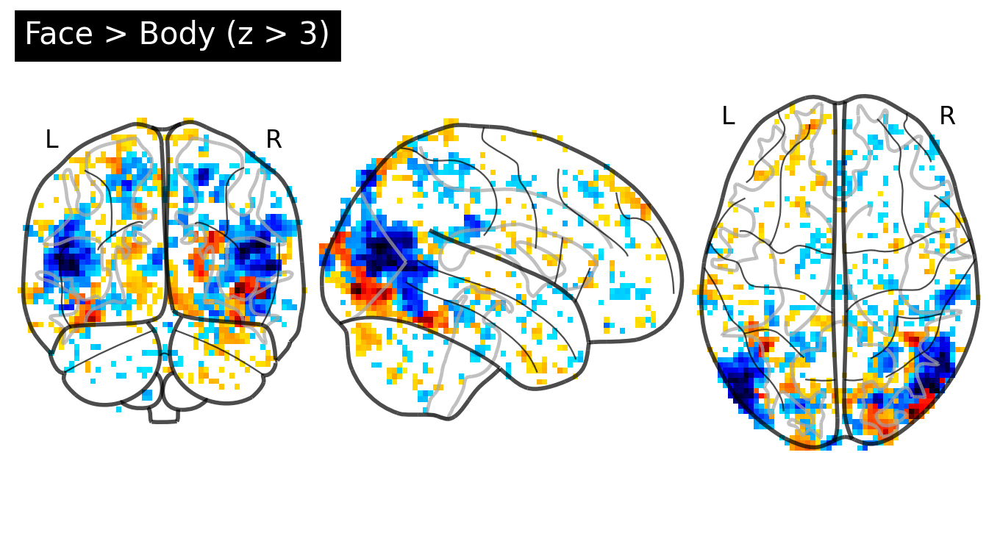

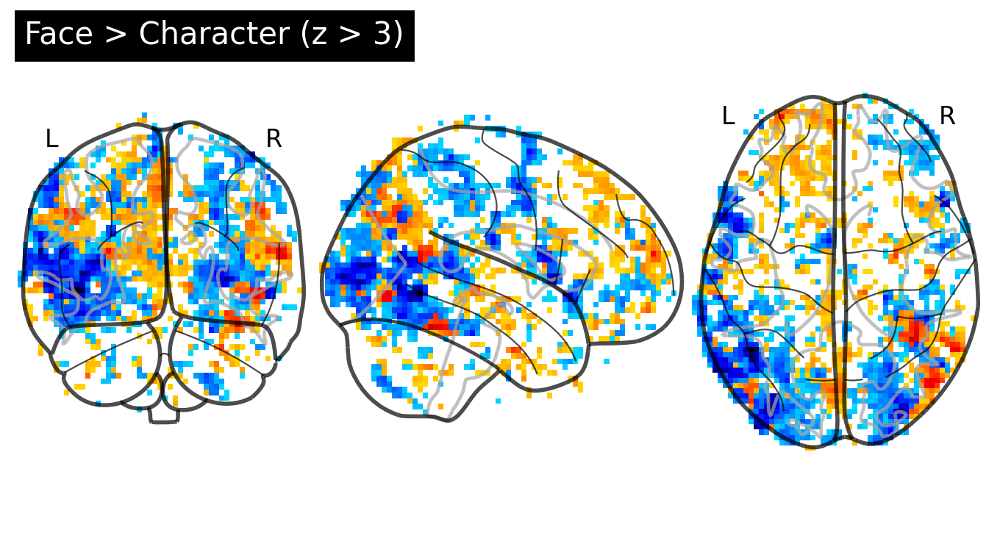

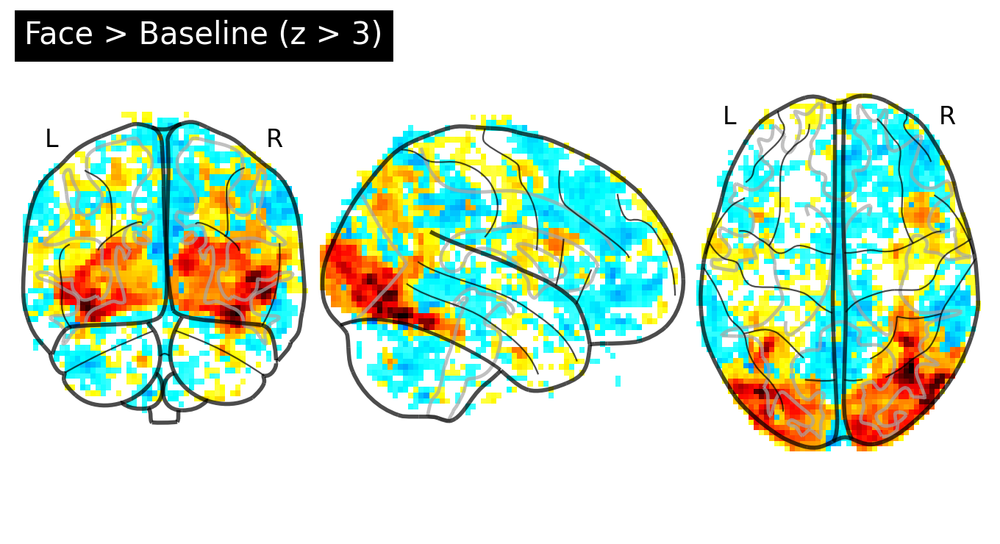

In [36]:
# Plot each z-map on a glass brain for quick inspection
for contrast_name, z_map in z_maps.items():
    plotting.plot_glass_brain(
        z_map,
        threshold=3,      # only show voxels with z > 3
        plot_abs=False,   # show positive and negative values separately
        title=f"{contrast_name} (z > 3)"
    )
    plotting.show()

<div class="alert alert-warning">
  <b>ToDo (2 points)</b>:  
    
  Work with the dictionary <code>different_contrasts</code>:  
  <ol>
    <li>For each contrast, compute a voxelwise <i>z</i>-map using <code>fmri_glm_fit.compute_contrast(..., output_type="z_score")</code>.</li>
    <li>Plot the resulting maps with <code>plot_glass_brain</code>, making sure each plot is clearly labeled with the contrast name and threshold.</li>
  </ol>
</div>

/home/user/.local/lib/python3.10/site-packages/nilearn/glm/contrasts.py:108: UserWarning: t contrasts should be of length P=29, but it has length 20. The rest of the contrast was padded with zeros.
  reg = regression_result[label_].Tcontrast(con_val)


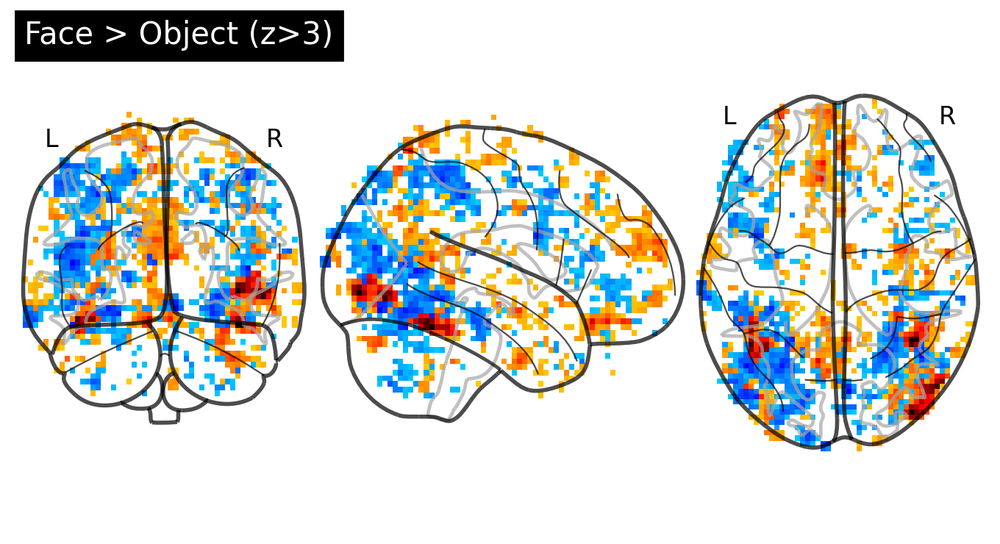

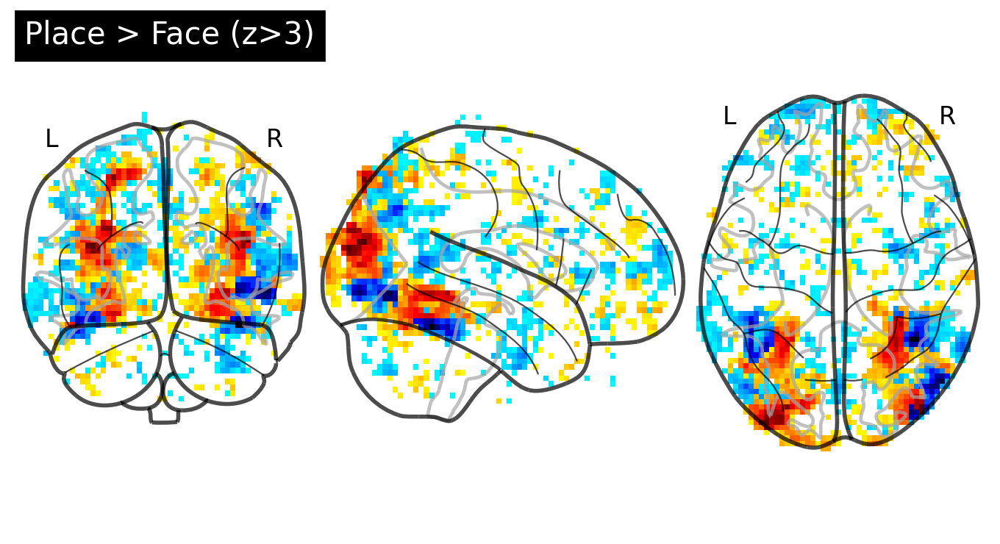

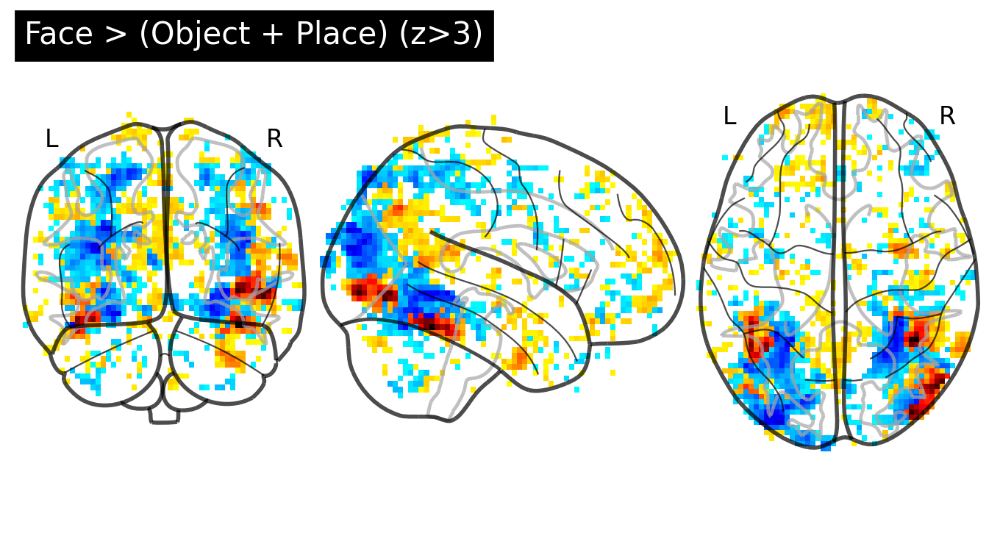

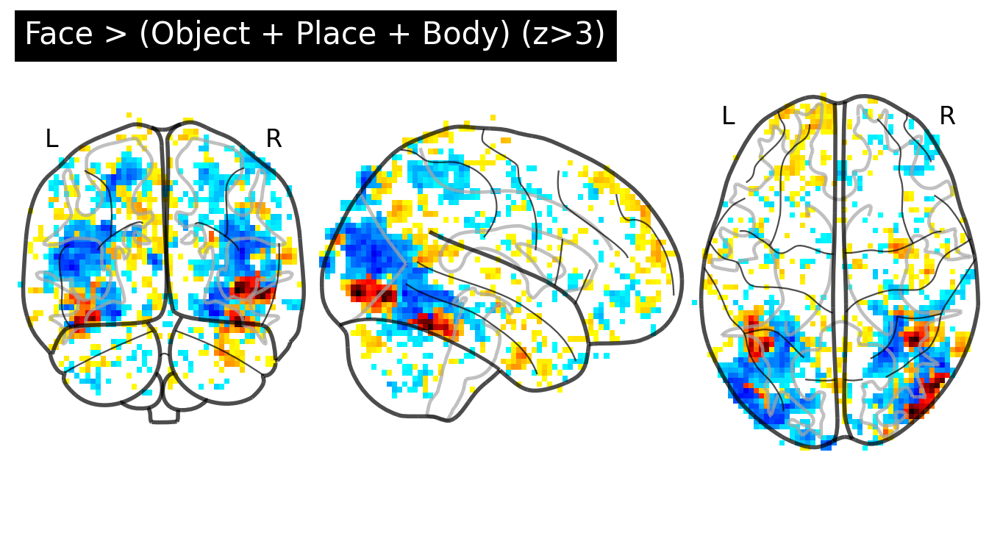

In [37]:
different_contrasts = {
    "Face > (Body + Character + Object + Place)": np.array([-1/4, -1/4,  1., -1/4, -1/4]),
    "Face > Place": np.array([0.,  0.,  1., 0.,  -1]),
}

# Pad each contrast to match the number of columns in the design matrix (confounds are set to 0)
n_cols = design_matrix.shape[1]
for name, vector in different_contrasts.items():
    if len(vector) > n_cols:
        raise ValueError(f"Contrast '{name}' has more elements than design matrix columns.")
    different_contrasts[name] = np.pad(vector, (0, n_cols - len(vector)), mode="constant")
    
# --- Implement your solution here ---
# YOUR CODE HERE

# voxel-wise z_maps
z_maps = []

for contrast_id, _ in new_contrasts.items():
    z_map = fmri_glm_fit.compute_contrast(
        new_contrasts[contrast_id],
        output_type='z_score'
        )
    z_maps.append(z_map)
    

for map, title in zip(z_maps, new_contrasts.keys()):
    plotting.plot_glass_brain(
        map, 
        threshold=3,
        plot_abs=False,
        title=f'{title} (z>3)'
        )
plotting.show()
# raise NotImplementedError()

Contrasts allow us to formally test hypotheses about brain activity.  

- A **t-test** is typically used to compare two conditions (e.g., *faces vs. objects*) or one condition against baseline (*faces vs. rest*). It tests whether the mean activation difference between the two is significantly different from zero.  

- Sometimes, however, we are interested in more complex hypotheses. For example, we might want to know whether the *face* condition elicits stronger activation than both the *body* and *character* conditions together.  

One way to test this is to **combine conditions in a single contrast vector**.  
For instance, the contrast `[-0.5, -0.5, 1]` represents *face > average(body, character)*. This is still a t-test, because it specifies a **single linear combination** of conditions. It answers a **directed hypothesis**: is face greater than the average of body and character?  

In other cases, we want a broader test that considers **multiple contrasts at once**. Here, an **F-test** is more appropriate. Unlike a t-test, which is limited to one linear contrast, an F-test can evaluate whether a **set of contrasts** jointly explains a significant amount of variance in the data. Put differently, it asks: *is there evidence that any of these effects are present?*  

For example, we might stack two contrasts:
```python
[ 0, -1,  1]   # face > body
[-1,  0,  1]   # face > character
```

Taken together in an F-test, this asks whether *face differs from body **or** character*. Importantly, the F-test does **not** tell us the direction of the effect (whether face is greater or smaller) — only that a reliable difference exists.  

In Nilearn, we can create F-tests by stacking the individual contrast vectors into a matrix.

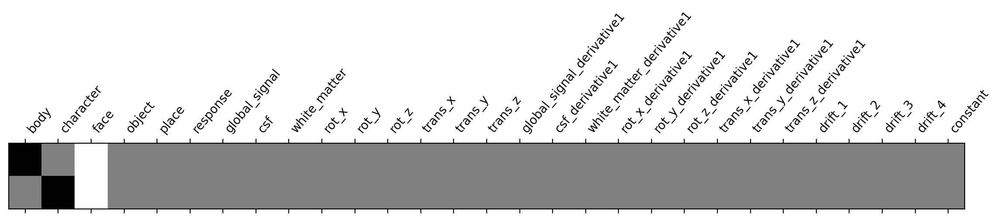

In [38]:
# Define an F-contrast by stacking multiple t-contrasts.
# Here we test whether "face" differs from either "body" or "character".
import numpy as np
effects_of_interest = np.vstack([
    contrasts["Face > Body"], 
    contrasts["Face > Character"]
])


# Visualize the F-contrast matrix in the context of the design matrix
plotting.plot_contrast_matrix(
    effects_of_interest, 
    design_matrix=design_matrix
)
plotting.show()

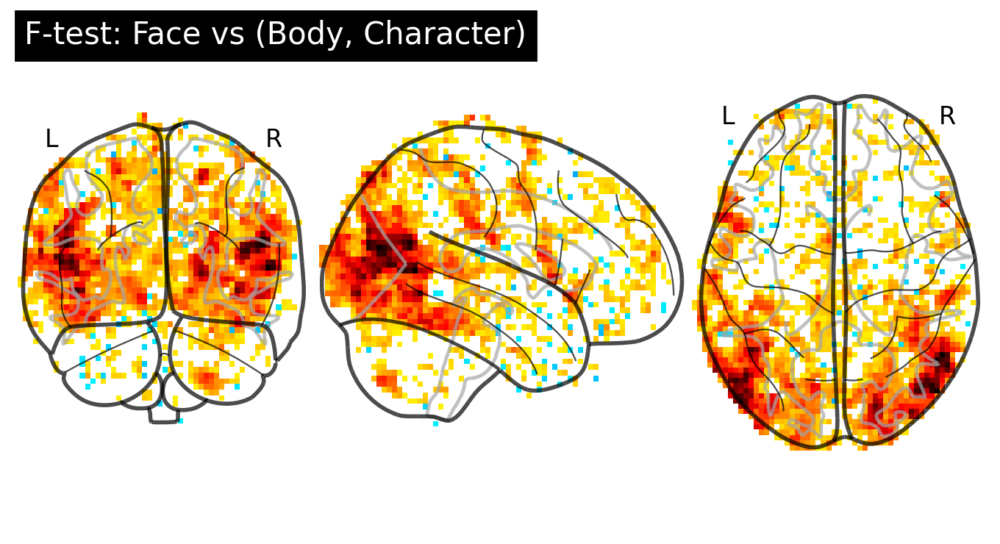

In [39]:
# Compute an F-test for the contrasts of interest
# (here: does "face" differ from "body" or "character"?)

face_vs_bodychar_zmap = fmri_glm.compute_contrast(
    effects_of_interest,
    output_type="z_score"
)

# Plot the resulting statistical map on a glass brain
plotting.plot_glass_brain(
    face_vs_bodychar_zmap,
    threshold=3,      # show only voxels with z > 3
    plot_abs=False,   # display positive and negative values separately
    title="F-test: Face vs (Body, Character)"
)
plotting.show()

<div class="alert alert-info">
  <b>💡 ToThink (ungraded)</b>:  
  Which functional regions do you think these two clusters represent?  
  <br>
  <i>Hint:</i> Check out the 
  <a href="https://en.wikipedia.org/wiki/Face_perception#Neuroanatomy_of_facial_processing" target="_blank">
  Face perception wiki page</a>.
</div>

<details>
  <summary><b>Show answer</b></summary>
    These clusters likely correspond to the <i>Fusiform Face Area (FFA)</i> and the <i>Occipital Face Area (OFA)</i>,  
  two core regions of the face perception network.
</details>

Before fitting all contrasts, we need to think about **multiple comparison correction**.  We will discuss this in detail in Week 6. For now, we just want to get a rough impression of the "real" effect.

In the images above, we used an **uncorrected threshold of z > 3**. This is often acceptable for **exploratory analyses**, but for **confirmatory analyses** we typically require a corrected threshold to reduce false positives.  

There are several approaches to multiple comparison correction:  
- **Bonferroni correction**: very conservative; controls the family-wise error rate.  
- **False Discovery Rate (FDR)**: less conservative than Bonferroni, but stricter than cluster-based methods; controls the expected proportion of false positives among significant results.  
- **Cluster-based correction**: sensitive and widely used; we’ll explore this in a later lab.  

For now, we will use **FDR correction**.  

Another common practice in neuroimaging is to **remove very small clusters**, which are often noise.  
In Nilearn, this can be done with the `cluster_threshold` parameter of `threshold_stat_img`.  
This sets the minimum number of voxels a cluster must have to appear in the results. For example, `cluster_threshold=10` removes clusters smaller than 10 voxels.  

Let’s apply this to the **Face > Body** contrast:

FDR threshold for 'Face > Body': z > 3.78


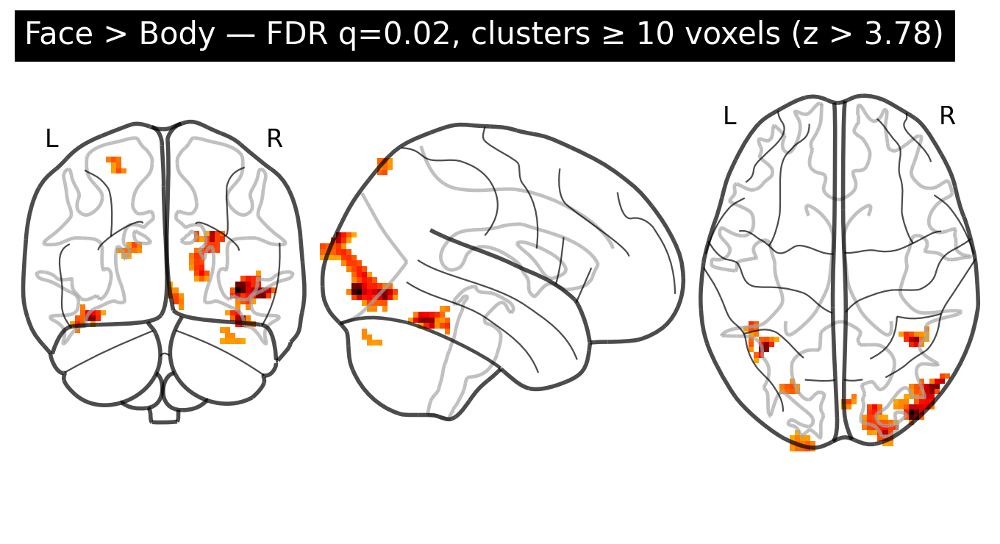

In [43]:
# FDR-threshold and clean the statistical map for a specific contrast
# (here: Face > Body), and remove tiny clusters.

from nilearn.glm.thresholding import threshold_stats_img

contrast_name = "Face > Body"
zmap = z_maps[contrast_name]  # keep labels; avoids relying on index order

clean_zmap, fdr_thresh = threshold_stats_img(
    zmap,
    alpha=0.02,              # target FDR (q)
    height_control="fdr",    # control method
    cluster_threshold=10,    # minimum cluster size (in voxels)
    two_sided=False          # set True if you want two-sided inference
)

if fdr_thresh is None:
    print(f"No voxels survived FDR q=0.02 for '{contrast_name}'.")
else:
    print(f"FDR threshold for '{contrast_name}': z > {fdr_thresh:.2f}")
    plotting.plot_glass_brain(
        clean_zmap,
        threshold=fdr_thresh,
        title=f"{contrast_name} — FDR q=0.02, clusters ≥ 10 voxels (z > {fdr_thresh:.2f})"
    )
    plotting.show()

<div class="alert alert-info">
  <b>💡 ToThink (ungraded)</b>:  
  Imagine you find a significant cluster with only a handful of voxels (e.g., 3–5).  
  How should you interpret this finding? What might be the potential issues with very small clusters?
</div>

<details>
  <summary><b>Show answer</b></summary>

  <p>Small clusters should be interpreted with caution:</p>

  <ul>
    <li>They are more likely to reflect <b>noise</b> or <b>false positives</b>, especially in the context of whole-brain analyses.</li>
    <li>Spatial smoothness in fMRI data means true activations usually extend over <b>larger, contiguous regions</b>.</li>
    <li>Tiny clusters may lack <b>biological plausibility</b> or may not align with known functional neuroanatomy.</li>
    <li>Applying a <b>minimum cluster size threshold</b> helps reduce spurious findings and ensures reported effects are more robust.</li>
  </ul>

  <p>
    In practice, very small clusters are usually not considered strong evidence on their own.  
    They should be interpreted carefully and ideally replicated in independent data.
  </p>

  <p><i>Note:</i> Whether small clusters are interpretable depends on the <b>research context</b>.  
  In whole-brain exploratory analyses, they are often suspicious.  
  But in targeted studies (e.g., fine-grained mapping in visual cortex at high field),  
  small clusters may be expected and meaningful.</p>

</details>

In most studies, we will want to **save the first-level results** so they can be used in a **second-level (group) analysis** later on.  
This becomes especially important when working with many participants, since re-running the first-level model for everyone would be very time-consuming.  

To save a statistical map as a file, we can use **Nibabel**, which allows us to write NIfTI images to disk:

In [44]:
import nibabel as nib

# Save the z-map to disk as a NIfTI file (compressed .nii.gz format)
nib.save(face_vs_bodychar_zmap, "face_vs_bodychar_zmap.nii.gz")

#### Evaluating the model fit  

Next, let’s examine how well our model explains the observed BOLD signal.  
This provides a useful check on whether the model is capturing the data appropriately.  

While we could inspect the fit at any voxel, it is most informative to focus on **voxels that show significant activation** for one of our contrasts.  
Why? Because these are the locations where our model has identified a reliable effect, meaning the regressors in our design matrix are likely driving the signal.  
Looking at non-significant voxels, by contrast, would mostly show noise or unrelated fluctuations, making it harder to see whether the model is working as intended.  

Here, we will therefore look at voxels within the clusters that were significantly more active for the **Face > Body** contrast.

In [45]:
from nilearn.reporting import get_clusters_table
from nilearn import input_data
from IPython.display import display

contrast_name = "Face > Body"
zmap = z_maps[contrast_name]

# Build a labeled table of clusters that pass the voxelwise and cluster thresholds
cluster_table = (
    get_clusters_table(
        zmap,
        stat_threshold=3,     # voxelwise threshold (z > 3)
        cluster_threshold=10  # min cluster size in voxels
    )
    .set_index("Cluster ID", drop=True)
)

# Show a preview
display(cluster_table.head())

# If nothing survived, stop
if cluster_table.empty:
    raise RuntimeError(f"No clusters survived (z>3, ≥10 voxels) for '{contrast_name}'.")

# Select up to the top 4 peak coordinates (in MNI mm) for time-series extraction.
peak_coords_mm = cluster_table[["X", "Y", "Z"]].head(4).to_numpy()

# Extract voxelwise signals around each peak using small spherical ROIs
# (radius can be tuned; 4–6 mm is common for peak-centered inspection)
masker = input_data.NiftiSpheresMasker(
    seeds=peak_coords_mm,
    radius=5,               # mm
    detrend=True,
    standardize="zscore_sample"  # make traces comparable across spheres
)

,X,Y,Z,Peak Stat,Cluster Size (mm3)
Cluster ID,,,,,
1,38.500002,-89.299999,-4.249999,9.955126,3702
1a,52.000003,-75.799999,-7.219999,8.287560,
1b,41.200002,-75.799999,-10.189999,5.079389,
1c,35.800002,-67.699999,-19.099999,4.600341,
2,-37.099999,-54.199999,-19.099999,8.104078,1407


The figure below shows the **time series extracted from the peak coordinates of the largest clusters** in the **Face > Body** contrast.  

- The **observed BOLD signal** is shown in grey.  
- The **signal predicted by the GLM** is shown in red.  
- The panel beneath each plot displays the **location of the corresponding peak voxel**, marked with a blue sphere.  

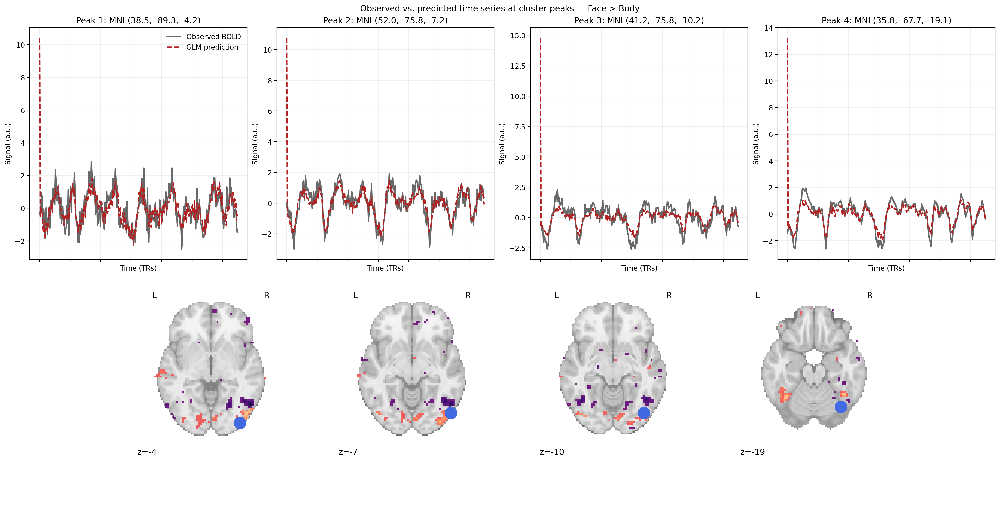

In [46]:
# 1) Fit the masker on the functional image
func_img = 'sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz'
masker.fit(func_img)  # func_img can be a NIfTI image or a filename

observed_ts  = masker.transform(func_img)              # shape: (n_TRs, n_peaks)
predicted_ts = masker.transform(fmri_glm.predicted[0]) # same shape

# 2) Decide how many peaks to show (up to 4 for readability)
n_peaks = min(4, observed_ts.shape[1])
if n_peaks == 0:
    raise RuntimeError("No peak coordinates available to extract time series.")

# 3) Prepare plotting
time = np.arange(observed_ts.shape[0])  # TR index (use TR*index if you want seconds)
fig, axes = plt.subplots(2, n_peaks, figsize=(20, 10), sharex="col", constrained_layout=True)
axes = np.atleast_2d(axes)  # ensure consistent indexing when n_peaks == 1

contrast_name = "Face > Body"
zmap = z_maps[contrast_name]

# 4) Plot each peak’s time series (top row) and location (bottom row)
for i in range(n_peaks):
    ax_ts  = axes[0, i] if n_peaks > 1 else axes[0, 0]
    ax_img = axes[1, i] if n_peaks > 1 else axes[1, 0]

    coord = np.round(peak_coords_mm[i], 1)  # (X, Y, Z) in MNI mm

    # Time series plot
    ax_ts.plot(time, observed_ts[:, i],  label="Observed BOLD",   color="dimgray",   lw=2)
    ax_ts.plot(time, predicted_ts[:, i], label="GLM prediction",  color="firebrick", ls="--", lw=2)
    ax_ts.set_title(f"Peak {i+1}: MNI {tuple(coord)}")
    ax_ts.set_xlabel("Time (TRs)")
    ax_ts.set_ylabel("Signal (a.u.)")
    ax_ts.grid(alpha=0.2)
    if i == 0:
        ax_ts.legend(frameon=False)

    # Peak location plot (z-slice with marker)
    display = plotting.plot_stat_map(
        zmap,
        display_mode="z",
        cut_coords=[coord[2]],
        threshold=3.0,
        axes=ax_img,
        colorbar=False,
        cmap="magma"
    )
    display.add_markers([coord], marker_color="royalblue", marker_size=300)

fig.suptitle(f"Observed vs. predicted time series at cluster peaks — {contrast_name}", y=1.02)
plt.show()

<div class="alert alert-info">
    💡<b>ToThink (ungraded)</b>:  
Look at the observed vs. predicted time series at the peak voxels:

- How would you judge the **model fit** overall?  
- Is the fit **equally good across voxels**, or does it vary? Why might that be?  
- What **specific steps** could improve the fit in future analyses?  
</div>

---

<details>
<summary><b>Show answer</b></summary>

**Is the fit equal across voxels?**  
No. Fit quality typically varies across voxels due to differences in signal-to-noise ratio, local neurovascular coupling, partial voluming, susceptibility artefacts, and whether the voxel truly participates in the task-related network.

**Ways to improve the fit:**
- **Richer basis for the HRF** (e.g., canonical + derivatives, FIR) to capture latency/shape differences (see Week 2 notebook).  
- **Better design**: improve timing/jitter, reduce collinearity, and model all relevant events and nuisance effects (see Week 3 notebook).  
- **Nuisance regressors**: motion parameters and their derivatives, physiological regressors, etc. (see preprocessing lecture).  
- **Temporal modelling**: appropriate high-pass filtering; robust prewhitening/AR(1) to handle autocorrelation (see preprocessing lecture).
- **Preprocessing upgrades**: slice-time correction (if needed), distortion correction, careful smoothing, accurate normalization (see Week 4 notebook).  
- **Data quality**: reduce motion, acquire more data (trials/runs), improve SNR.  

*Note:* A “good” fit in a single voxel is less important than **consistent, interpretable effects across a region** and robust statistics at the appropriate (first/second) level.
</details>

We can also evaluate the **model fit across the entire brain**, rather than only at a few peak voxels.  
This gives us a global view of how well the model explains the data, and can help identify regions where the fit is poor.  

For example, low fit in the **ventricles** or **white matter** may suggest that the model does not adequately capture noise sources such as motion or physiological confounds.  

A useful way to summarise model fit is to compute and plot the voxelwise **$R^2$ values**, which indicate the proportion of variance explained by the model at each location.  
We can visualise these $R^2$ maps using Nilearn’s `plot_stat_map` function.

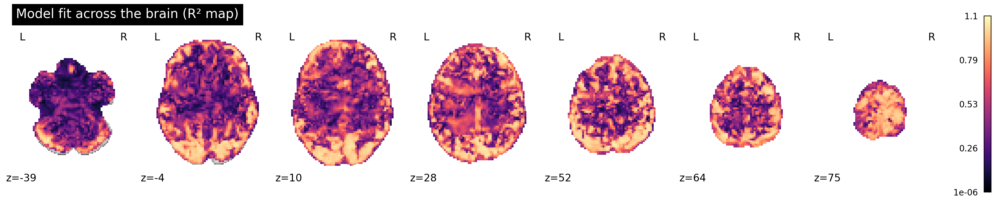

In [47]:
# Plot voxelwise R² values (variance explained by the model) across the brain
plotting.plot_stat_map(
    fmri_glm.r_square[0],
    display_mode="z",   # show multiple slices along the z-axis
    cut_coords=7,       # number of slices to display
    cmap="magma",       # colormap: dark background with bright highlights
    colorbar=True,
    title="Model fit across the brain (R² map)"
)
plotting.show()

<div class="alert alert-info">
💡 <b>ToThink (ungraded)</b>  
When you look at the $R^2$ map, you will notice that the variance explained by the model is not uniform across the brain.  

- Where is the fit generally **better**?  
- Where is the fit generally **worse**?  
- Why might this pattern occur?  
</div>

---

<details>
<summary><b>Show answer</b></summary>

**Where is the fit better?**  
- In **grey matter regions** that are strongly engaged by the task (e.g., visual cortex for a visual face/body task).  
- These voxels contain signal closely aligned with the experimental design.

**Where is the fit worse?**  
- In **ventricles and white matter**, where BOLD signal is dominated by noise and not task-related activity.  
- At the edges of the brain, near sinuses or areas prone to susceptibility artefacts.

**Why this pattern occurs**  
- The GLM is designed to capture task-related signal, which is mainly found in grey matter.  
- White matter and CSF are dominated by physiological noise (heartbeat, respiration) and motion artefacts,which may not be completely captured by the nuios.  
- Differences in vascular and neuroanatomical properties also influence how well the model explains the data.

</details>

Finally, let's check out the data that we <em>couldn't</em> explain: the residuals ($y - \hat{y}$).

Mean residuals (peak 1, MNI (38.5, -89.3, -4.2)): 0.000
Mean residuals (peak 2, MNI (52.0, -75.8, -7.2)): -0.000
Mean residuals (peak 3, MNI (41.2, -75.8, -10.2)): 0.000
Mean residuals (peak 4, MNI (35.8, -67.7, -19.1)): -0.000


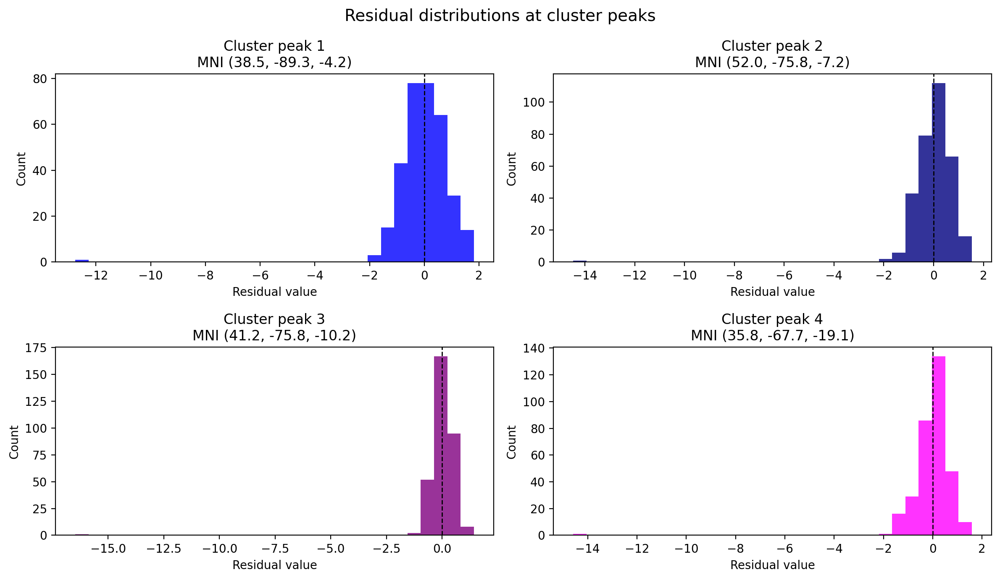

In [48]:
# --- Inspect residual distributions at peak voxels ---

# Extract residual time series at the same sphere ROIs
residuals = masker.fit_transform(fmri_glm.residuals[0])

# Define a color palette for plotting
colors = ["blue", "navy", "purple", "magenta", "olive", "teal"]

# Plot histograms of residuals for the first 4 peaks
n_peaks_to_show = min(4, residuals.shape[1])
fig, axes = plt.subplots(2, 2, figsize=(12, 7))
axes = axes.flatten()

for i in range(n_peaks_to_show):
    coord = np.round(peak_coords_mm[i], 1)  # use updated variable name
    ax = axes[i]

    ax.hist(residuals[:, i], bins=30, color=colors[i], alpha=0.8)
    ax.axvline(0, color="black", lw=1, linestyle="--")  # reference line at zero
    ax.set_title(f"Cluster peak {i+1}\nMNI {tuple(coord)}")
    ax.set_xlabel("Residual value")
    ax.set_ylabel("Count")

    mean_val = residuals[:, i].mean()
    print(f"Mean residuals (peak {i+1}, MNI {tuple(coord)}): {mean_val:.3f}")

fig.suptitle("Residual distributions at cluster peaks", fontsize=14)
fig.tight_layout()
plt.show()

<div class="alert alert-info">
💡 <b>ToThink (1 point)</b><br>
Residuals reflect the part of the signal that is <i>not</i> explained by the model.  

- What kind of distribution should the residuals ideally follow if the GLM assumptions hold?  
- Looking at the histograms above, do the residuals appear to follow this distribution?  
    
💡 Keep your explanation concise — this will be graded manually (no feedback cell).
</div>

To meet the assumptions of the GLM, the residuals should be uncorrelated, have equal variances, and have a mean of 0. The plots above do not have a mean of 0, so it appears as though the model misspecified the intercept \(i.e., the voxels' activity has been underestimated\). This could also be related to the first volumes of the series. Additionally, we often assume that the residuals are normally distributed. From the plots above it looks like this is roughly the case, although it is a bit hard to be certain. Ideally, the assumption of normality should therefore be checked more thoroughly if it is important for the planned analyses.


Evaluating the **$R^2$ maps** and the **residuals** is a useful way to detect **unmodelled sources of variance** in your data (e.g., motion, physiological noise, scanner drift).  
These unexplained signals end up in the noise term ($\sigma^2$) of the GLM, reducing sensitivity.  

By identifying and addressing such issues (e.g., adding nuisance regressors, improving preprocessing, or refining the model design), you can improve the overall quality and reliability of your analysis.  

*Aside:* For reliability, these kinds of checks and model adjustments should ideally be carried out on **pilot data** or within a **training set**, not on the final test data. This helps prevent circularity and overfitting.

You’ve reached the end of the **second section** in this notebook.  

In this section, you learned how to:  
- Define and fit **first-level GLM models** using Nilearn  
- Create **contrasts** to statistically compare experimental conditions  
- Evaluate the **model fit** using contrasts, $R^2$ maps, and residuals  

# Part 3: Higher-level analysis  

In this week’s lecture, we explored the logic of **multilevel models** and the **summary statistics approach**.  

- In many non-fMRI contexts, data from multiple runs are often analysed within a single multilevel GLM by “concatenating” the data.  
- In fMRI, however, this strategy is rarely used because of the very large data volumes and computational demands.  
- Instead, we typically rely on the **summary statistics approach**: each run (or subject) is analysed separately at the **first level**, and the resulting contrast estimates are then combined in a **second-level GLM**.  

In this notebook, we will extend this concept of multilevel analysis to **group-level data**.  
You will learn how to analyse results from multiple subjects using both **parametric** and **non-parametric** methods for group inference.  

![](https://docs.google.com/drawings/d/e/2PACX-1vQxCH3WU3nTqFlHUZb49rf9zioivGQ-flVfRpwmXQx7OF5Wm_1T6gFMYQqpqt-NPITNHUaRoVYEREgT/pub?w=965&h=745)

## Parametric analyses  

The most commonly used approach for fMRI group-level analyses is **parametric analysis**.  
This approach assumes that the data can be described by specific probability distributions.  

For example, in classical GLM-based fMRI, we assume that under the null hypothesis the test statistic for a contrast estimate (e.g., a $t$-value) follows a **Student’s $t$-distribution** with a certain number of degrees of freedom:

\begin{align}
t_{c\hat{\beta}} \sim \mathcal{T}(\mathrm{df})
\end{align}

Here, the symbol $\sim$ means *“is distributed as”*.  

The validity of the computed $p$-values depends on this assumption. If the assumption is violated, the result may be an inflated **Type I error** (false positives) or **Type II error** (false negatives).  

---

### Group-level parametric analysis  
In a group analysis, the results of the first-level contrasts ($c\hat{\beta}^{*}$) become the **dependent variable** for the group-level model ($y^{\dagger}$).  
Here, we use the *dagger* superscript ($^{\dagger}$) to denote terms in the **group-level model** (just as the *star* superscript $^{*}$ referred to first-level terms earlier).  

\begin{align}
y^{\dagger} = c\hat{\beta}^{*}
\end{align}

At the group level, we again have a GLM with its own design matrix ($\mathbf{X}^{\dagger}$), parameters ($\beta^{\dagger}$), and residuals ($\epsilon^{\dagger}$):  

\begin{align}
y^{\dagger} = \mathbf{X}^{\dagger}\beta^{\dagger} + \epsilon^{\dagger}
\end{align}

The group-level parameters are estimated with ordinary least squares (OLS):  

\begin{align}
\hat{\beta}^{\dagger} = (\mathbf{X}^{\dagger\ T} \mathbf{X}^{\dagger})^{-1}\mathbf{X}^{\dagger}y^{\dagger}
\end{align}

---

### A note on inference at the group level  
While estimating $\hat{\beta}^{\dagger}$ is straightforward, the **inference step** depends critically on how we model variance across subjects:  

- **Fixed effects**: assume no between-subject variability. 
  Should **never** be used for group inference, as it dramatically inflates Type I error.  

- **Random effects**: treat subject-level estimates as a random sample from the population.  
  Appropriate when the goal is to generalise to the population.  

- **Mixed effects**: combine fixed and random effects, offering more flexibility in modelling.  

In practice, when drawing conclusions at the population level, analyses should be based on **random or mixed-effects models**, not fixed effects.

---

### Parametric vs. non-parametric  
- The **first-level GLMs** we have used so far are all *parametric*.  
- There are also **non-parametric approaches**, which do not rely on distributional assumptions.  
  While computationally more demanding, they are becoming increasingly popular for group-level inference.  

It’s important to note that **parametric and non-parametric approaches differ only in how we perform statistical inference**, not in how we estimate the parameters.  
In both cases, we first estimate the regression coefficients ($\hat{\beta}$) with ordinary least squares (OLS).  
The difference comes when we ask: *“Is this effect significant?”*:
- **Parametric methods** answer this by assuming a specific distribution for the test statistic (e.g., a $t$-distribution).  
- **Non-parametric methods** avoid distributional assumptions by building an empirical null distribution (e.g., by permutation testing).  

### Random effects  

We will first look at a **random-effects analysis**, which is the standard approach for group-level fMRI analysis (for example, this is the default in SPM). Random-effects models are relatively intuitive and widely used when the goal is to generalise from a sample of participants to the population.  

To make things concrete, let’s work with **simulated data**.  
Suppose we want to run a group-level analysis of our run-level `flocBLOCKED` dataset. Specifically, we are interested in the difference between **faces** and **places**.  

Formally, our hypotheses are:  

$$
H_{0}: \beta_{\text{face}}^{*} = \beta_{\text{place}}^{*} = 0  
$$

$$
H_{a}: \beta_{\text{face}}^{*} > \beta_{\text{place}}^{*}  
$$

In practice, this means we will take the **contrast estimates from the first-level (run-level) analyses** — $c\hat{\beta}^{*}$ — and treat them as the input ($y^{\dagger}$) for the group-level model.  

For $N$ subjects, this can be represented as:  

\begin{align}
y^{\dagger} = \begin{bmatrix}
c\hat{\beta}^{*}_{1, F>0} \\
c\hat{\beta}^{*}_{2, F>0} \\
\vdots \\
c\hat{\beta}^{*}_{N, F>0} \\
c\hat{\beta}^{*}_{1, P>0} \\
c\hat{\beta}^{*}_{2, P>0} \\
\vdots \\
c\hat{\beta}^{*}_{N, P>0}
\end{bmatrix}
\end{align}

For this simulation, we will assume a sample size of $N = 20$ subjects.  

---

### Constructing the group-level design matrix  

Next, we need to construct the **design matrix** ($\mathbf{X}^{\dagger}$) for our group-level GLM.  
Because we have 20 subjects and two conditions of interest (faces vs. places), the design matrix will reflect:  

- The subject structure (20 participants)  
- The two sets of first-level contrast estimates ($c\hat{\beta}^{*}_{F>0}$ and $c\hat{\beta}^{*}_{P>0}$)  

We’ll now build this design matrix step by step before simulating the data.

In [49]:
import numpy as np

# Number of subjects
N = 20

# Create a group-level design matrix with 2 conditions: faces and places
# Rows = observations (2 conditions × N subjects = 40 total)
# Columns = regressors (face, place)
X_group = np.zeros((N * 2, 2))

# First N rows correspond to the "faces" condition
X_group[:N, 0] = 1  

# Last N rows correspond to the "places" condition
X_group[N:, 1] = 1  

print("Design matrix shape:", X_group.shape)
print(X_group)

Design matrix shape: (40, 2)
[[1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]]


<div class="alert alert-info">
💡 <b>ToThink (1 point)</b><br>
In the design matrix above, we did <i>not</i> include an intercept (a column of ones).  

- Why is the intercept redundant in this case?  
- Why would adding it make the group-level GLM impossible to estimate?  
</div>

In this case, the intercept is redundant because  Each row already belongs to either the "face" or "place" regressor, so the design matrix already accounts for the mean. The beta coefficients \(y\* in the second\-level analysis\) are already on a scale with a meaningful interpretation \(i.e., beta = 0 means no systematically higher or lower activation for the given participant\) and this is an important property that we want to retain. 

Adding an intercept would make the GLM impossible to estimate because the design matrix would become rank\-deficient or multicolinear, since the intercept could be computed by adding both predictor vectors together.


Complete answers:
- **0.5 points**: Explains that the intercept is **redundant**  because each row already belongs to either the “face” or “place” regressor, so the design matrix fully accounts for the mean.  
- **0.5 points**: Explains that adding the intercept makes the GLM **impossible to estimate** because the intercept is a perfect linear combination of the existing regressors → design matrix becomes rank deficient / multicollinear.  

Partial answers:  
- Mentions only “redundant” without explanation → 0.25 points.  
- Mentions only “linear dependence” without linking to estimation failure → 0.25 points.  

We are going to simulate data for a single voxel, which shows a slight preference (in the first-level $c\hat{\beta}^{*}$ estimates across subjects) for faces relative to places. Specifically, we'll assume that the voxel activates on average with $\beta^{\dagger}_{faces} = 5$ for faces, while it activates on average with $\beta^{\dagger}_{places} = 4.5$ for places:

\begin{align}
y^{*} = \mathbf{X}^{\dagger}_{faces}\cdot 5 + \mathbf{X}^{\dagger}_{places} \cdot 4.5 + \epsilon^{\dagger} 
\end{align}

where the noise, $\epsilon^{\dagger}$, is normally distributed with mean 0 and a standard deviation of 1:

\begin{align}
\epsilon^{\dagger} \sim \mathcal{N}(0, 1)
\end{align}

(The symbol $\sim$ stands for "is distributed as".) We'll implement this in code below:

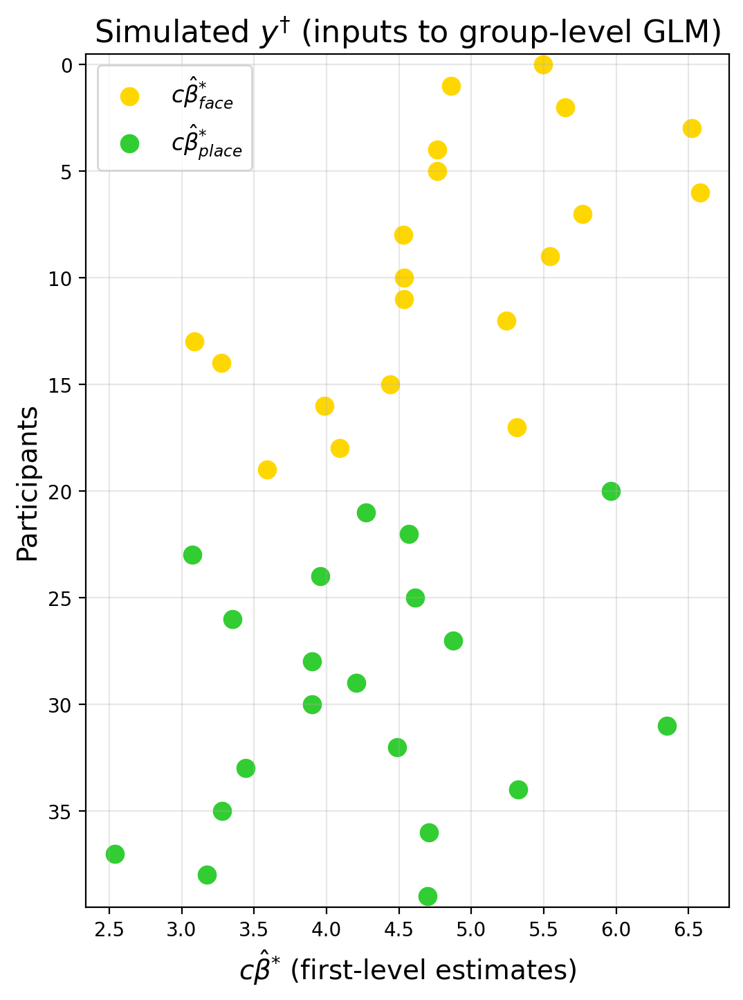

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# --- Parameters ---
N = 20                 # number of subjects
beta_face = 5          # true mean response for faces
beta_place = 4.5       # true mean response for places
std_noise = 1          # standard deviation of noise

# --- Simulate data ---
np.random.seed(42)  # for reproducibility
noise = np.random.normal(0, std_noise, size=N * 2)

# Linear model: X @ betas + noise
y_sim = X_group @ np.array([beta_face, beta_place]) + noise

# --- Plotting ---
fig, ax = plt.subplots(figsize=(6, 8))

# Plot face estimates (first N subjects)
ax.scatter(
    y_sim[:N], np.arange(N),
    color="gold", marker="o", s=80, label=r"$c\hat{\beta}^{*}_{face}$"
)

# Plot place estimates (next N subjects)
ax.scatter(
    y_sim[N:], np.arange(N, 2*N),
    color="limegreen", marker="o", s=80, label=r"$c\hat{\beta}^{*}_{place}$"
)

# Axis labels and style
ax.set_ylim(2*N - 0.5, -0.5)  # flip y-axis so subject 1 is at the top
ax.set_ylabel("Participants", fontsize=14)
ax.set_xlabel(r"$c\hat{\beta}^{*}$ (first-level estimates)", fontsize=14)
ax.set_title(r"Simulated $y^{\dagger}$ (inputs to group-level GLM)", fontsize=16)

ax.legend(fontsize=12)
ax.grid(alpha=0.3)

plt.show()

Note that for a **random-effects analysis**, the only inputs we need are the subject-level contrast estimates ($c\hat{\beta}^{*}$).  
In this framework, we deliberately **ignore the lower-level variance terms** (e.g., voxelwise residual variance from the first-level model).  
Instead, the analysis focuses solely on the variability of the contrast estimates **across subjects**, which is what allows us to generalise to the population.

<div class="alert alert-warning">
  <b>ToDo (2 points)</b><br>
  Implement a <b>group-level random-effects GLM</b> using the simulated data:  

  1. Use <tt>X_group</tt> as the design matrix and <tt>y_sim</tt> as the dependent variable.  
  2. Estimate the group-level parameters and store them in a variable called <tt>gl_params</tt>.  
  3. Compute the <i>t</i>-value for the contrast <tt>β<sup>†</sup><sub>face</sub> > β<sup>†</sup><sub>place</sub></tt>,  
     and store the result in a variable named <tt>gl_tvalue</tt>.  
</div>

In [52]:
# --- Implement your solution here. ---
import numpy as np
from numpy.linalg import inv

# YOUR CODE HERE
# group-level parameters
gl_params = inv(X_group.T @ X_group) @ X_group.T @ y_sim
print(gl_params)

cvec = np.array([1, -1]) 
df = 18
y_hat = X_group @ gl_params
sigma_hat = (np.sum((y_sim - y_hat) ** 2)) / df
des_var = cvec @ inv(X_group.T @ X_group) @ cvec.T

contrast = cvec @ gl_params

# t values
gl_tvalue = contrast / np.sqrt(sigma_hat * des_var)
print(sigma_hat, des_var, gl_tvalue)
# raise NotImplementedError()

[4.82870144 4.23402488]
1.96201759654315 0.1 1.3425465938272774


In [53]:
# Feedback cell: gl_params
if 'gl_params' not in locals():
    print('The variable "gl_params" is not defined. Check that you created and named the variable correctly.')
elif not gl_params.shape == (2,):
    print('The variable "gl_params" should be an array with shape (2,)')
elif gl_params[0] < -5 or gl_params[0] > 25:
    print(f"Intercept ({intercept:.3f}) seems unusually large")
elif abs(gl_params[1]) > 15:
    print(f"Effect ({effect:.3f}) seems unusually large")
print('Your answer passed the automated checks.')

Your answer passed the automated checks.


In [54]:
# Feedback cell: gl_tvalue
if 'gl_tvalue' not in locals():
    print('The variable "gl_tvalue" is not defined. Check that you created and named the variable correctly.')
elif not np.isscalar(gl_tvalue):
    print('The variable "gl_tvalue" should have a single value')
elif np.abs(gl_tvalue) > 20:
    print('The t-value seems unusually large. Please check your calculation.')
print('Your answer passed the automated checks.')

Your answer passed the automated checks.


### Mixed-effects models in Nilearn  

Next, let’s turn to **mixed-effects models** and how they are applied in fMRI analysis.  

In traditional statistics, we would often include **“subject” as a random effect** and fit the model to the entire dataset at once.  
For fMRI, however, this direct approach is impractical: concatenating all first-level time series across participants into a single dataset would require enormous memory and computational resources.  

Instead, fMRI analyses rely on a **summary statistics approach**:  
- From each participant’s first-level analysis, we extract both the **beta maps** (effect size estimates) and the **variance maps** (uncertainty of those estimates).  
- In a **fixed-effects analysis**, we ignored the variance maps and treated all participants as if they contributed equally.  
- In a **mixed-effects analysis**, we *do* incorporate the variance maps, which means participants with more precise estimates get more weight in the group model.  

This approach allows us to properly account for **between-subject variability**, while keeping the computation tractable.  

---

For this demonstration, we use data from a **language localiser task** (a smaller dataset than NI-edu, which is too large for this server).  
- **Task:** 10 participants alternated between reading **real words** and strings of **random letters**.  
- **Contrast of interest:** `language - strings`.  
- **First-level preprocessing (already run for you):**  
  - Six motion confounds (translations and rotations in x, y, z)  
  - High-pass filter at 0.01 Hz  
  - Spatial smoothing with a 4 mm FWHM kernel  
  - Prewhitening with an AR(1) model  

---

Let’s start by examining the **beta-** and **variance-maps** from the first-level models – this will take a few minutes to run:


Added README.md to .


Dataset created in ./fMRI-language-localizer-demo-dataset



Downloaded 116277248 of 749503182 bytes (15.5%,    5.5s remaining)

Downloaded 238280704 of 749503182 bytes (31.8%,    4.3s remaining)

Downloaded 361906176 of 749503182 bytes (48.3%,    3.2s remaining)

Downloaded 500039680 of 749503182 bytes (66.7%,    2.0s remaining)

Downloaded 586309632 of 749503182 bytes (78.2%,    1.4s remaining)

Downloaded 684179456 of 749503182 bytes (91.3%,    0.6s remaining)

 ...done. (8 seconds, 0 min)
Extracting data from ./fMRI-language-localizer-demo-dataset/fMRI-language-localizer-demo-dataset.zip...

.. done.
/home/user/.local/lib/python3.10/site-packages/nilearn/glm/first_level/first_level.py:1374: UserWarning: 'StartTime' not found in file /home/user/assignments/week_5/fMRI-language-localizer-demo-dataset/derivatives/sub-01/func/sub-01_task-languagelocalizer_desc-preproc_bold.json.
  StartTime = infer_slice_timing_start_time_from_dataset(


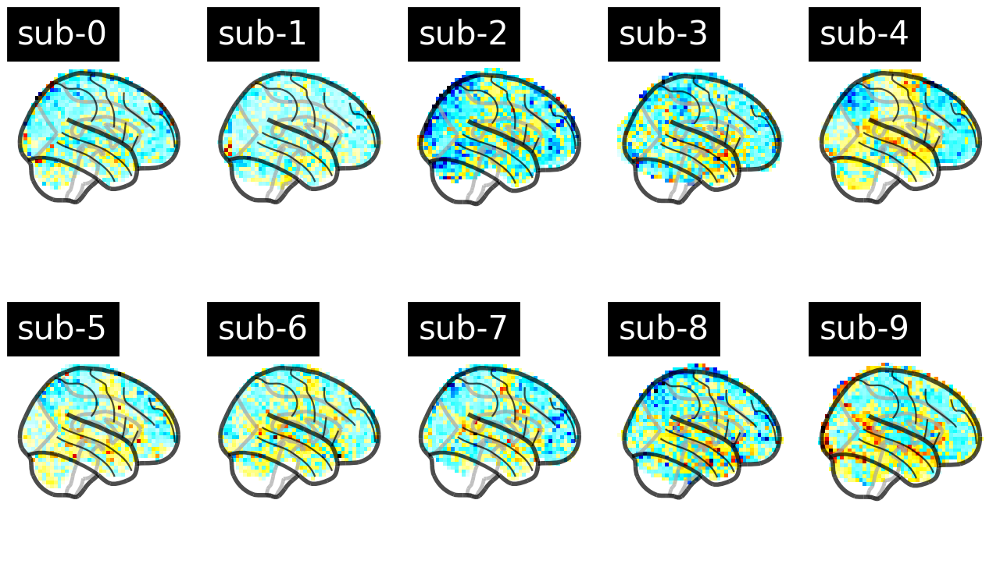

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import plotting
from nilearn.datasets import fetch_language_localizer_demo_dataset
from nilearn.glm.first_level import first_level_from_bids

# --- Fetch demo data (BIDS-like layout) ---
data = fetch_language_localizer_demo_dataset(data_dir=".", legacy_output=False, verbose=True)
bids_root = data["data_dir"]

# --- Build first-level models from BIDS ---
# In this demo the task label is "languagelocalizer" and trial types are "language" vs "string"
task_label = "languagelocalizer"
models, run_imgs, events, confounds = first_level_from_bids(
    bids_root,
    task_label=task_label,
    img_filters=[("desc", "preproc")]  # select preprocessed images
)

contrast_name = "language-string"

# --- Prepare storage for later second-level analysis ---
beta_imgs = []      # effect size maps (β̂)
var_imgs  = []      # variance of the effect size maps Var(β̂)

n = len(models)
n_cols = min(5, n)
n_rows = int(np.ceil(n / n_cols))

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 4.5))

for idx, (model, imgs, ev, cf) in enumerate(zip(models, run_imgs, events, confounds)):
    # Fit GLM for this subject
    model.fit(imgs, events=ev, confounds=cf)

    # Compute β (effect size) and its variance for the contrast of interest
    beta_img = model.compute_contrast(contrast_name, output_type="effect_size")
    var_img  = model.compute_contrast(contrast_name, output_type="effect_variance")

    beta_imgs.append(beta_img)
    var_imgs.append(var_img)
    
    plotting.plot_glass_brain(
        beta_img,
        colorbar=False,
        title=f"sub-{idx}",
        axes=axes[int(idx / 5), int(idx % 5)],
        plot_abs=False,
        display_mode="x",
    )

plotting.show()

**Note**: You will probably see a warning that 'StartTime' is not found. This is missing from the description of the dataset and can be ignored for the purpose of this tutorial.

As the first-level results above illustrate, there is **both overlap and variability** in the activation patterns across participants.  
We also see clear differences in the **amount of variance** associated with each participant’s estimates.  

To take this into account, we will now include **both the effect size maps** and their corresponding **variance maps** for each participant in our second-level (group-level) model:

In [56]:
import numpy as np
import statsmodels.api as sm

# --- Flatten beta/variance maps into subject × voxel arrays ---
n_subjects = len(beta_imgs)
img_shape = beta_imgs[0].shape
n_voxels = np.prod(img_shape)

betas = np.vstack([img.get_fdata().reshape(-1) for img in beta_imgs])   # shape: (S, V)
vars_  = np.vstack([img.get_fdata().reshape(-1) for img in var_imgs])   # shape: (S, V)

# Mask out voxels that are NaN/inf or have zero variance across subjects
finite_mask = np.isfinite(betas).all(axis=0) & np.isfinite(vars_).all(axis=0)
betas = betas[:, finite_mask]
vars_  = vars_[:, finite_mask]
V_masked = betas.shape[1]

# --- Intercept-only second-level design (random/mixed-effects via WLS) ---
design_matrix = np.ones((n_subjects, 1))   # intercept-only

group_effects   = np.zeros(V_masked)
group_variances = np.zeros(V_masked)

# Small constant to stabilise weights if any per-subject variance is ~0
eps = 1e-6

for v in range(V_masked):
    y = betas[:, v]
    regularised_vars = vars_[:, v] + eps
    weights = 1.0 / regularised_vars

    model = sm.WLS(y, design_matrix, weights=weights)
    res = model.fit()

    group_effects[v]   = res.params[0]         # β̂_group (weighted mean)
    group_variances[v] = res.bse[0] ** 2       # Var(β̂_group)

# --- t-stats for H0: β_group = 0 ---
standard_errors = np.sqrt(group_variances) + eps
t_stats = group_effects / standard_errors

Let's visualise the resulting t-statistic map

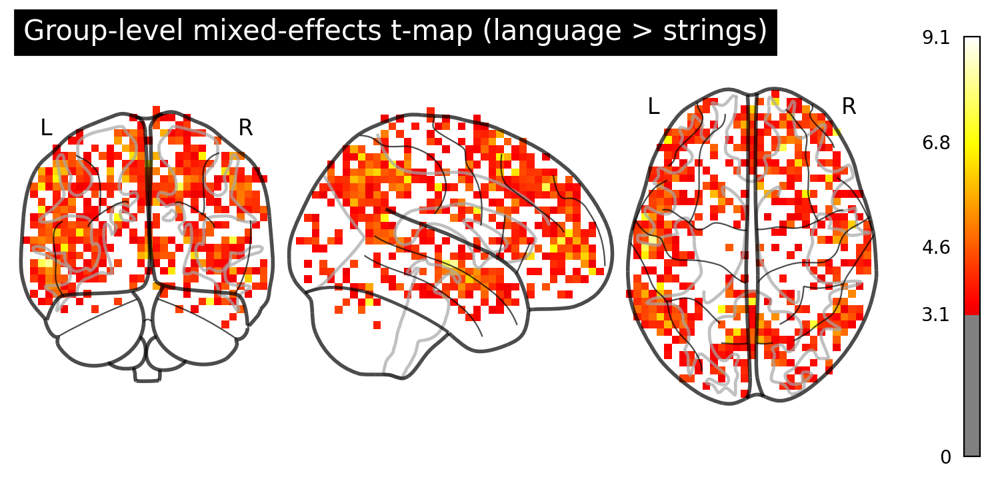

In [57]:
import nibabel as nib
from nilearn import plotting

# Use the first subject's beta map as a template for shape/affine
samp_img = beta_imgs[0]
img_shape = samp_img.shape
affine = samp_img.affine

# Reinsert masked t-stats into full 3D space
full_t_stats = np.zeros(np.prod(img_shape))
full_t_stats[finite_mask] = t_stats
t_stats_img = full_t_stats.reshape(img_shape)

# Create a NIfTI image
t_stats_nii = nib.Nifti1Image(t_stats_img, affine)

# Plot: group-level mixed-effects t-map
plotting.plot_glass_brain(
    t_stats_nii,
    cmap="hot",
    threshold=3.1,   # roughly p < 0.001 (uncorrected)
    colorbar=True,
    title="Group-level mixed-effects t-map (language > strings)"
)
plotting.show()

<div class="alert alert-warning">
  <b>ToDo (2 points)</b><br>
  The group-level map shows a large number of active voxels. Let’s quantify this:  

  1. Calculate the number of voxels that are significant at <i>p</i> < 0.001  
     (i.e., voxels with |t| > 3.1, two-sided).  
     Store this value in a variable called <tt>sign_voxels</tt>.  

  2. Under the null hypothesis, some voxels will pass this threshold purely by chance.  
     Calculate the expected number of such false positives (0.001 × total number of voxels),  
     and store this in a variable called <tt>expected_fp</tt>.  

  <b>Hint:</b> Make sure <tt>expected_fp</tt> is an integer (no decimals).
</div>

In [60]:
from scipy.stats import t

# Number of subjects
n_subjects = 10  # Replace with the actual number if different
df = n_subjects - 1

# Compute p-values (two-tailed)
p_values = 2 * (1 - t.cdf(np.abs(t_stats), df=df))

# --- Implement your solution here ---
# YOUR CODE HERE
# calculating significant voxels
sign_voxels = 0
for i in p_values:
    if i < 0.001:
       sign_voxels += 1 

# calculating false positives
expected_fp = int(p_values.size * 0.001)

print(f'Number of voxels with p<0.001: {sign_voxels}')
print(f'Expected number of false positives: {expected_fp}')
# raise NotImplementedError()

Number of voxels with p<0.001: 77
Expected number of false positives: 102


In [61]:
# Feedback cell
if 'sign_voxels' not in locals():
    print('The variable "sign_voxels" is not defined.')
elif not isinstance(sign_voxels, (int, np.integer)):
    print('sign_voxels should be an integer (count of voxels).')
elif sign_voxels < 0:
    print('Number of significant voxels cannot be negative.')
else:
    print("'sign_voxels' passed the automated checks.")

if 'expected_fp' not in locals():
    print('The variable "expected_fp" is not defined.')
elif expected_fp < 0:
    print('Expected false positives cannot be negative.')
elif expected_fp > 10000:
    print('Expected false positives seems too high - check your calculation.')
else:
    print("'expected_fp' passed the automated checks.")

if 'sign_voxels' in locals() and 'expected_fp' in locals():
    if expected_fp == 0:
        print('Expected false positives is 0 - did you multiply by 0.001?')
    elif sign_voxels > expected_fp * 100:
        print('Your significant voxels count seems unusually high relative to expected false positives.')
    else:
        print("'sign_voxels' and 'expected_fp' passed the automated checks")

'sign_voxels' passed the automated checks.
'expected_fp' passed the automated checks.
'sign_voxels' and 'expected_fp' passed the automated checks


In practice, we should **never report uncorrected results** like the ones shown above.  
Without correction, we greatly increase the risk of reporting false positives — as famously demonstrated in the “dead salmon” study, where significant activation was found in a fish that was not alive.  

We will discuss methods for **multiple comparisons correction** in detail next week.  
For now, keep in mind that uncorrected results are only useful for exploration, not for formal reporting.

## Non-Parametric Analysis  

So far in this course, we have mostly relied on **parametric analyses**.  
These approaches assume that the data follow a specific probability distribution — usually the **normal (Gaussian) distribution** — and rely on parameters such as the mean and standard deviation.  

But what if:  
- the data do not follow a known distribution, or  
- the sample size is too small to reliably test distributional assumptions?  

In such cases, **non-parametric approaches** provide a robust alternative.  
Instead of relying on theoretical distributions, they use **resampling techniques** (such as permutation or bootstrap methods):  

- The observed data are repeatedly compared to **randomised versions** of themselves.  
- After many iterations, this produces an **empirical null distribution** that represents what we would expect by chance.  
- We can then evaluate how extreme the observed results are compared to this baseline.  

Why not always use non-parametric methods?  
The main drawback is **computational cost**: resampling thousands of times can be demanding, especially for large datasets or complex models.  
That said, for many fMRI analyses it is both **feasible and increasingly popular**, and non-parametric approaches are now widely used in neuroimaging research.

#### Simulation  

To build some intuition, let’s start with **simulated data**.  
Imagine a single voxel measured under two conditions.  
For example, in a language task this might represent BOLD activity in the **left inferior frontal gyrus (IFG)** while participants read **real words** versus **random strings**.  

Our goal is to test whether there is a **condition effect** — that is, whether one condition elicits significantly more (or less) activity than the other.  
We begin by calculating the **observed difference in means** between the two conditions.  

For the **non-parametric test**, we then:  
1. **Randomly shuffle the condition labels**, breaking any true link between condition and data.  
2. Recalculate the mean difference after each shuffle.  
3. Repeat this process many times to build a **null distribution** of differences expected purely by chance.  

Finally, we compare the **observed mean difference** to this null distribution.  
If the observed difference is very unlikely under the null, we conclude that there is evidence for a true condition effect.

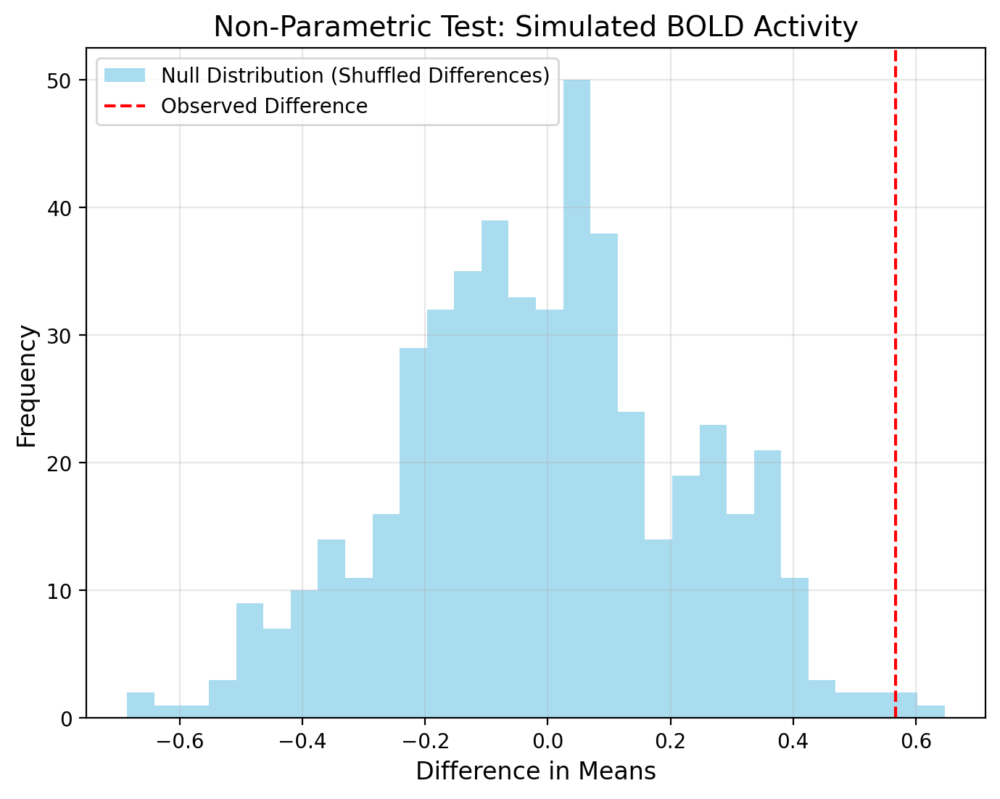

Permutation p-value: 0.010


In [9]:
# Step 1: Generate simulated BOLD activity for two conditions
np.random.seed(42)
condition1 = np.random.normal(5, 1, 30)  # Condition 1 (e.g., reading real words)
condition2 = np.random.normal(5.5, 1, 30)  # Condition 2 (e.g., reading random strings)

# Step 2: Observed difference in means
observed_diff = np.mean(condition2) - np.mean(condition1)

# Step 3: Combine data for permutation testing
combined_data = np.concatenate([condition1, condition2])
n_permutations = 500  # Number of random shuffles
perm_diffs = []

# Step 4: Generate null distribution by shuffling labels
for _ in range(n_permutations):
    np.random.shuffle(combined_data)
    perm_condition1 = combined_data[:30]
    perm_condition2 = combined_data[30:]
    perm_diff = np.mean(perm_condition2) - np.mean(perm_condition1)
    perm_diffs.append(perm_diff)

# Step 5: Calculate p-value
perm_diffs = np.array(perm_diffs)
p_value = np.mean(np.abs(perm_diffs) >= np.abs(observed_diff))

# Step 6: Visualise results
plt.figure(figsize=(8, 6))
plt.hist(perm_diffs, bins=30, alpha=0.7, label='Null Distribution (Shuffled Differences)', color='skyblue')
plt.axvline(observed_diff, color='red', linestyle='--', label='Observed Difference')
plt.title("Non-Parametric Test: Simulated BOLD Activity", fontsize=14)
plt.xlabel("Difference in Means", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.show()
    
print('Permutation p-value: %.3f' % p_value)

As the histogram above shows, the random permutations generate a **null distribution** of mean differences.  
This distribution often resembles a Gaussian, but the key point is that it represents the differences we would expect **purely by chance**.  

We can calculate a **p-value** by asking:  
*What proportion of permuted differences are equal to or more extreme than the observed difference?*  

Because this proportion is based on a finite number of permutations, the **precision of the p-value** depends on how many permutations we run.  
The more permutations we perform, the more accurate (and stable) our p-value estimate becomes.

<div class="alert alert-warning">
  <b>ToDo (1 point)</b><br>
  Run a simulation with a mean condition difference of <tt>0.5</tt>.  
  Perform the non-parametric test using:  
  <ul>
    <li>500 permutations → store the resulting p-value in <tt>p_500</tt></li>
    <li>1000 permutations → store the resulting p-value in <tt>p_1000</tt></li>
  </ul>
</div>

In [16]:
# Please leave this unchanged
np.random.seed(42)
n = 30

# --- Implement your solution here ---
# YOUR CODE HERE
# simulating data for both conditions
condition1 = np.random.normal(5, 1, n)  
condition2 = np.random.normal(5.5, 1, n)  

# calculating observed difference in means
observed_diff = np.mean(condition2) - np.mean(condition1)

# for 500 permutations
# combining data for permutation testing
combined_data = np.concatenate([condition1, condition2])
n_permutations = 500  # Number of random shuffles
perm_diffs = []

# shufling labels to generate null distribution 
for _ in range(n_permutations):
    np.random.shuffle(combined_data)
    perm_condition1 = combined_data[:n]
    perm_condition2 = combined_data[n:]
    perm_diff = np.mean(perm_condition2) - np.mean(perm_condition1)
    perm_diffs.append(perm_diff)

# calculate p-value for 500 permutations
perm_diffs = np.array(perm_diffs)
p_500 = np.mean(np.abs(perm_diffs) >= np.abs(observed_diff))
print('Permutation p-value (500 shuffles): %.3f' % p_500)

# for 1000 permutations
# combining data for permutation testing
combined_data = np.concatenate([condition1, condition2])
n_permutations = 1000  # Number of random shuffles
perm_diffs = []

# shufling labels to generate null distribution
for _ in range(n_permutations):
    np.random.shuffle(combined_data)
    perm_condition1 = combined_data[:n]
    perm_condition2 = combined_data[n:]
    perm_diff = np.mean(perm_condition2) - np.mean(perm_condition1)
    perm_diffs.append(perm_diff)

# calculate p-value for 1000 permutations
perm_diffs = np.array(perm_diffs)
p_1000 = np.mean(np.abs(perm_diffs) >= np.abs(observed_diff))
print('Permutation p-value (1000 shuffles): %.3f' % p_1000)
 # raise NotImplementedError()

Permutation p-value (500 shuffles): 0.010
Permutation p-value (1000 shuffles): 0.021


In [17]:
# Feedback cell
for variable_name in ['p_500', 'p_1000']:
    print(f'Checking "{variable_name}"')
    if variable_name not in locals():
        print(f'The variable "{variable_name}" is not defined. Check that you created and named the variable correctly.')
    else:
        variable = locals()[variable_name]
        if not np.isscalar(variable):
            print(f'The variable "{variable_name}" should have a single value (a p-value).')
        elif variable < 0 or variable > 1:
            print(f'{variable_name} should be a p-value between 0 and 1.')
        elif variable > 0.5:
            print(f'{variable_name} seems very high for a p-value - check your calculation.')
        elif variable < 1e-10:
            print(f'{variable_name} seems extremely small - check for numerical issues.')
        else:
            print(f'{variable_name} looks reasonable.')

if 'p_500' in locals() and 'p_1000' in locals():
    if p_1000 == p_500:
        print('p_500 and p_1000 are identical - double-check your calculations.')

Checking "p_500"
p_500 looks reasonable.
Checking "p_1000"
p_1000 looks reasonable.


Now that we have some understanding of what happens under the hood, we turn to neuroimaging data:

/home/user/.local/lib/python3.10/site-packages/nilearn/plotting/displays/_slicers.py:308: UserWarning: empty mask
  ims = self._map_show(img, type="imshow", threshold=threshold, **kwargs)


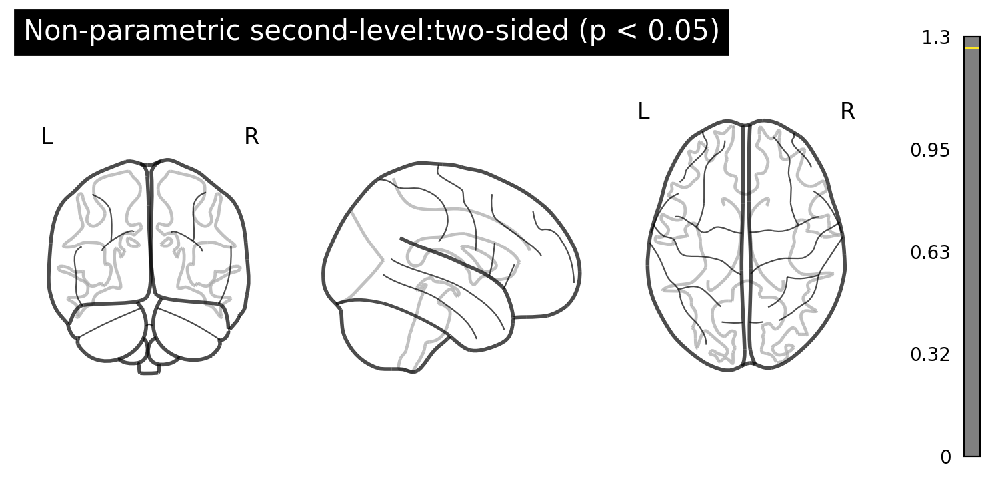

In [73]:
import numpy as np
import pandas as pd
from nilearn import plotting
from nilearn.glm.second_level import non_parametric_inference

# One-sample (intercept-only) second-level design
n_subjects = len(beta_imgs)
design_matrix = pd.DataFrame({"intercept": np.ones(n_subjects)})

# Non-parametric permutation test (returns −log10(p) image)
neg_log_pvals_img = non_parametric_inference(
    second_level_input=beta_imgs,          # list of subject β maps
    design_matrix=design_matrix,
    second_level_contrast="intercept",     # test mean effect across subjects
    model_intercept=False,                  # already included in design_matrix
    n_perm=500,                             
    two_sided_test=True,
)

# Threshold for p < 0.05 in −log10(p) space
thr = -np.log10(0.05)

# Plot
plotting.plot_glass_brain(
    neg_log_pvals_img,
    threshold=thr,
    colorbar=True,
    cmap="viridis",
    title="Non-parametric second-level:two-sided (p < 0.05)"
)
plotting.show()

<div class="alert alert-info">
  💡 <b>ToThink (1 point)</b><br>
  In a permutation test, the number of permutations determines how precise your p-value estimate can be.  

  - Why does increasing the number of permutations improve the reliability of the test?  
  - What is the <b>minimum possible p-value</b> you can obtain with 500 permutations? With 1000 permutations?  
</div>

We calculate the p\-value by looking at the proportion of simulated data equal to or more extreme than what we observed. The fewer permutation tests we do, the less precise that estimate becomes because it is limited by the amount of simulated data. Thus, increasing the number of permutations improves the reliability of the test. 

The p\-value is calculated as 1\+\(N\+1\) where N = number of permutations. Thus, the minimum p\-value for 500 permutations is 1/501 = ~0.00199, while the minimum p\-value for 1000 permutations is 1/1001 = ~0.001. 


In [18]:
# Please run this cell to clear up space on the server. If you need the data again, just run the download cell at the beginning of the notebook.

for file in [
    "face_vs_bodychar_zmap.nii.gz",
    "facebodyrest_z_map.nii.gz",
    "sub-01_task-auditoryoddball_events.tsv",
    "sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv",
    "sub-03_ses-1_task-flocBLOCKED_events.tsv",
    "sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz",
    "sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz",
    "README.md"
]:
    if os.path.isfile(file):
        os.remove(file)
        print(f'Removed file {file}')
    else:
        print(f'File {file} not found')
        
from shutil import rmtree
if os.path.isdir('./fMRI-language-localizer-demo-dataset'):
    rmtree('./fMRI-language-localizer-demo-dataset')
    print('Removed ./fMRI-language-localizer-demo-dataset')
else:
    print('./fMRI-language-localizer-demo-dataset not found')

Removed file face_vs_bodychar_zmap.nii.gz
File facebodyrest_z_map.nii.gz not found
Removed file sub-01_task-auditoryoddball_events.tsv
Removed file sub-03_ses-1_task-flocBLOCKED_desc-confounds_timeseries.tsv
Removed file sub-03_ses-1_task-flocBLOCKED_events.tsv
Removed file sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz
Removed file sub-03_ses-1_task-flocBLOCKED_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
Removed file README.md
Removed ./fMRI-language-localizer-demo-dataset


In this section, you learned how to:  
- conduct **higher-level analyses** across participants,  
- apply **mixed-effects models** to account for between-subject variability,  
- use **non-parametric methods** for robust, distribution-free inference.  

---

## 🎉 Well done!  

Congratulations! You’ve reached the end of this week’s assignment!  